#Environment Setup and Dataset Download

In [ ]:
# to install necessary libraries
!pip3 install ultralytics matplotlib opencv-python pandas

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 904.3/904.3 kB 24.0 MB/s eta 0:00:00


In [ ]:
# to import required libraries
import os
import shutil
import json
import random
from zipfile import ZipFile
import requests
import cv2
import matplotlib.pyplot as plt
import matplotlib.patches as patches

In [ ]:
# to create directories for dataset structure for YoLo
def create_dataset_structure(base_path):
    os.makedirs(os.path.join(base_path, "train", "images"), exist_ok=True)
    os.makedirs(os.path.join(base_path, "train", "labels"), exist_ok=True)
    os.makedirs(os.path.join(base_path, "test", "images"), exist_ok=True)
    os.makedirs(os.path.join(base_path, "test", "labels"), exist_ok=True)

In [ ]:
# to define base path for the dataset
dataset_path = "car_parts_dataset"
create_dataset_structure(dataset_path)

In [ ]:
# to download the dataset
url = "https://github.com/dsmlr/Car-Parts-Segmentation/archive/refs/heads/master.zip"
dataset_zip = "car_parts_dataset.zip"
response = requests.get(url)

with open(dataset_zip, "wb") as file:
    file.write(response.content)

# to extract the dataset
with ZipFile(dataset_zip, 'r') as zip_ref:
    zip_ref.extractall(".")

# the updated paths based on the required file hierarchy for Yolo
extracted_folder = "Car-Parts-Segmentation-master"
training_images = os.path.join(extracted_folder, "trainingset", "JPEGImages")
training_annotations = os.path.join(extracted_folder, "trainingset", "annotations.json")
testing_images = os.path.join(extracted_folder, "testset", "JPEGImages")
testing_annotations = os.path.join(extracted_folder, "testset", "annotations.json")

# to move extracted data to the dataset directory
try:
    if os.path.exists(training_images):
        shutil.move(training_images, os.path.join(dataset_path, "train", "images"))
    else:
        print("Training images folder not found. Check extracted contents.")

    if os.path.exists(training_annotations):
        shutil.move(training_annotations, os.path.join(dataset_path, "train", "annotations.json"))
    else:
        print("Training annotations file not found. Check extracted contents.")

    if os.path.exists(testing_images):
        shutil.move(testing_images, os.path.join(dataset_path, "test", "images"))
    else:
        print("Testing images folder not found. Check extracted contents.")

    if os.path.exists(testing_annotations):
        shutil.move(testing_annotations, os.path.join(dataset_path, "test", "annotations.json"))
    else:
        print("Testing annotations file not found. Check extracted contents.")
except Exception as e:
    print(f"Error during file organization: {e}")


# to clean up unnecessary files
os.remove(dataset_zip)
shutil.rmtree(extracted_folder, ignore_errors=True)

print("The dataset is downloaded and strucrured into the required format successfully.")

The dataset is downloaded and strucrured into the required format successfully.


**to move all the images from JPEGImages subfolder into Images subfolder and delete JPEGImages subfolder**

In [ ]:
# to move all the images from JPEGImages subfolder into Images subfolder and delete JPEGImages subfolder

def move_images_and_delete_folder(src_folder, dest_folder):
    os.makedirs(dest_folder, exist_ok=True)

    for file_name in os.listdir(src_folder):
        src_file = os.path.join(src_folder, file_name)
        dest_file = os.path.join(dest_folder, file_name)
        shutil.move(src_file, dest_file)

    # to delete the source folder
    os.rmdir(src_folder)

src_folder = "/content/car_parts_dataset/train/images/JPEGImages"
dest_folder = "/content/car_parts_dataset/train/images"
move_images_and_delete_folder(src_folder, dest_folder)

src_folder = "/content/car_parts_dataset/test/images/JPEGImages"
dest_folder = "/content/car_parts_dataset/test/images"
move_images_and_delete_folder(src_folder, dest_folder)

#Annotation Parsing and Preprocessing

In [ ]:
# function to convert COCO bbox to YOLO format

def coco_to_yolo(bbox, img_width, img_height):
    x, y, width, height = bbox
    x_center = (x + width / 2) / img_width
    y_center = (y + height / 2) / img_height
    width /= img_width
    height /= img_height
    return x_center, y_center, width, height

In [ ]:
# to load the annotations from train and test directories

for subset in ["train", "test"]:
    subset_annotations_path = os.path.join(dataset_path, subset, "annotations.json")
    if not os.path.exists(subset_annotations_path):
        raise FileNotFoundError(f"Annotations file not found in {subset} folder: {subset_annotations_path}")

    with open(subset_annotations_path, "r") as file:
        annotations = json.load(file)

    # to parse annotations and save in YOLO format
    for img_info in annotations["images"]:
        img_id = img_info["id"]
        img_name = img_info["file_name"]
        img_width = img_info["width"]
        img_height = img_info["height"]

        # to generate YOLO label file
        yolo_label_path = os.path.join(dataset_path, subset, "labels", img_name.replace(".jpg", ".txt"))
        with open(yolo_label_path, "w") as label_file:
            for ann in annotations["annotations"]:
                if ann["image_id"] == img_id:
                    bbox = ann["bbox"]
                    category_id = ann["category_id"]
                    yolo_bbox = coco_to_yolo(bbox, img_width, img_height)
                    label_file.write(f"{category_id} {yolo_bbox[0]} {yolo_bbox[1]} {yolo_bbox[2]} {yolo_bbox[3]}\n")

print("!!!Hurrah,<<<>>>>Annotations parsed and converted to YOLO format successfully!!!!")

!!!Hurrah,<<<>>>>Annotations parsed and converted to YOLO format successfully!!!!


**Reducing the class IDs by 2 to bring them in [0-17] class ranges --> total 18 classes**

In [ ]:
# to reduces class IDs by 2 in all label files within training and testing folders

def reduce_class_ids(label_dir):
    for label_file in os.listdir(label_dir):
        label_path = os.path.join(label_dir, label_file)

        # to check if the file is a .txt file
        if os.path.isfile(label_path) and label_file.endswith('.txt'):
            with open(label_path, "r") as file:
                lines = file.readlines()

            updated_lines = []
            for line in lines:
                parts = line.strip().split()
                if len(parts) > 0:
                    # Reduce the class_id by 2
                    class_id = int(parts[0]) - 2
                    if class_id < 0:
                        print(f"Invalid class ID in {label_file}: {line.strip()}")
                        continue
                    updated_line = f"{class_id} " + " ".join(parts[1:]) + "\n"
                    updated_lines.append(updated_line)

            # to overwrite the label file with updated lines
            with open(label_path, "w") as file:
                file.writelines(updated_lines)
            print(f"Updated class IDs in {label_file}")

train_label_dir = "/content/car_parts_dataset/train/labels"
test_label_dir = "/content/car_parts_dataset/test/labels"

# to reduce class IDs by 2 in both training and testing directories
reduce_class_ids(train_label_dir)
reduce_class_ids(test_label_dir)

print("all the class IDs are reduced by 2 in all label files[0-17]")

Updated class IDs in train75.txt
Updated class IDs in train61.txt
Updated class IDs in train133.txt
Updated class IDs in train335.txt
Updated class IDs in train302.txt
Updated class IDs in train56.txt
Updated class IDs in train357.txt
Updated class IDs in train43.txt
Updated class IDs in train95.txt
Updated class IDs in train262.txt
Updated class IDs in train21.txt
Updated class IDs in train202.txt
Updated class IDs in train225.txt
Updated class IDs in train333.txt
Updated class IDs in train99.txt
Updated class IDs in train153.txt
Updated class IDs in train193.txt
Updated class IDs in train63.txt
Updated class IDs in train244.txt
Updated class IDs in train82.txt
Updated class IDs in train42.txt
Updated class IDs in train322.txt
Updated class IDs in train3.txt
Updated class IDs in train130.txt
Updated class IDs in train310.txt
Updated class IDs in train352.txt
Updated class IDs in train303.txt
Updated class IDs in train214.txt
Updated class IDs in train372.txt
Updated class IDs in train

**To split the training folder into train and validation datasets in 80:20 ratio**

In [ ]:
source_directory = "/content/car_parts_dataset/train"
train_directory = "/content/car_parts_dataset/training_set"
validation_directory = "/content/car_parts_dataset/validation_set"

os.makedirs(os.path.join(train_directory, "images"), exist_ok=True)
os.makedirs(os.path.join(train_directory, "labels"), exist_ok=True)
os.makedirs(os.path.join(validation_directory, "images"), exist_ok=True)
os.makedirs(os.path.join(validation_directory, "labels"), exist_ok=True)

In [ ]:
def split_dataset(source_dir, train_dir, val_dir, split_ratio=0.8):
    os.makedirs(train_dir, exist_ok=True)
    os.makedirs(val_dir, exist_ok=True)

    images = [f for f in os.listdir(os.path.join(source_dir, "images")) if f.endswith(".jpg")]
    random.shuffle(images)     # to shuffle the images randomly

    split_index = int(len(images) * split_ratio)
    train_images = images[:split_index]
    val_images = images[split_index:]


     # moving images and labels to the train/val folders
    for image_name in train_images:
        shutil.move(os.path.join(source_dir, "images", image_name), os.path.join(train_dir, "images"))
        label_name = image_name.replace(".jpg", ".txt")
        if os.path.exists(os.path.join(source_dir, "labels", label_name)):
            shutil.move(os.path.join(source_dir, "labels", label_name), os.path.join(train_dir, "labels"))

    for image_name in val_images:
        shutil.move(os.path.join(source_dir, "images", image_name), os.path.join(val_dir, "images"))
        label_name = image_name.replace(".jpg", ".txt")
        if os.path.exists(os.path.join(source_dir, "labels", label_name)):
            shutil.move(os.path.join(source_dir, "labels", label_name), os.path.join(val_dir, "labels"))

split_dataset(source_directory, train_directory, validation_directory)
print("The training dataset is split into train and validation sets successfully")

The training dataset is split into train and validation sets successfully


#Creating car_parts_dataset.yaml

In [ ]:
data_yaml = """

train: /content/car_parts_dataset/training_set
val: /content/car_parts_dataset/validation_set
test: /content/car_parts_dataset/test

nc: 18

names: ['back_bumper', 'back_glass', 'back_left_door', 'back_left_light',
        'back_right_door', 'back_right_light',
        'front_bumper', 'front_glass', 'front_left_door', 'front_left_light',
        'front_right_door',
        'front_right_light', 'hood', 'left_mirror', 'right_mirror', 'tailgate',
        'trunk', 'wheel']
"""

# to save the YAML configuration
with open("car_parts_dataset.yaml", "w") as file:
    file.write(data_yaml)

#Model Training

In [ ]:
# to install Ultralytics for YOLOv8
!pip3 install ultralytics

In [ ]:
from ultralytics import YOLO

# the path to the YOLOv8 configuration file
model = YOLO("yolov8s.pt")

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


100%|██████████| 21.5M/21.5M [00:00<00:00, 394MB/s]


**Model Training**

In [ ]:
# training YOLOv8 on our car parts dataset for 20 epochs
results = model.train(
    data="car_parts_dataset.yaml",
    epochs=50,
    lr0=0.01,
    optimizer="adam",
    imgsz=640,
    batch=16,
    name="car_parts_detection"
)

Ultralytics 8.3.55 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov8s.pt, data=car_parts_dataset.yaml, epochs=50, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=car_parts_detection2, exist_ok=False, pretrained=True, optimizer=adam, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True,

train: Scanning /content/car_parts_dataset/training_set/labels.cache... 320 images, 0 backgrounds, 0 corrupt: 100%|██████████| 320/320 [00:00<?, ?it/s]

albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))



val: Scanning /content/car_parts_dataset/validation_set/labels.cache... 80 images, 0 backgrounds, 0 corrupt: 100%|██████████| 80/80 [00:00<?, ?it/s]


Plotting labels to runs/detect/car_parts_detection2/labels.jpg... 
optimizer: Adam(lr=0.01, momentum=0.937) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/car_parts_detection2
Starting training for 50 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/50       6.1G      1.547      2.496      1.621        186        640: 100%|██████████| 20/20 [00:09<00:00,  2.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/3 [00:00<?, ?it/s]

WARNING ⚠️ NMS time limit 3.600s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:09<00:00,  3.21s/it]

                   all         80        617          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/50      6.05G      1.515      2.169      1.594        218        640: 100%|██████████| 20/20 [00:08<00:00,  2.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.60it/s]

                   all         80        617     0.0706     0.0692    0.00706    0.00366



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/50      6.18G      1.522      2.133      1.601        165        640: 100%|██████████| 20/20 [00:06<00:00,  3.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.15it/s]

                   all         80        617      0.451     0.0381    0.00738    0.00202



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/50      6.33G      1.453      1.934      1.545        231        640: 100%|██████████| 20/20 [00:07<00:00,  2.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.75it/s]


                   all         80        617    0.00199     0.0716    0.00144   0.000313

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/50      6.15G      1.475       1.98      1.575        196        640: 100%|██████████| 20/20 [00:07<00:00,  2.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.71it/s]

                   all         80        617      0.135      0.102     0.0172    0.00679



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/50      6.39G      1.454      1.881      1.538        178        640: 100%|██████████| 20/20 [00:06<00:00,  3.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.13it/s]

                   all         80        617      0.173     0.0561    0.00277   0.000739



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/50      6.41G      1.351      1.721      1.464        178        640: 100%|██████████| 20/20 [00:07<00:00,  2.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.32it/s]

                   all         80        617      0.292      0.114     0.0536     0.0276



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/50       6.4G      1.362      1.704      1.457        212        640: 100%|██████████| 20/20 [00:05<00:00,  3.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.75it/s]

                   all         80        617      0.324      0.125     0.0677     0.0309



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/50      6.33G       1.29      1.546      1.388        220        640: 100%|██████████| 20/20 [00:08<00:00,  2.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.63it/s]

                   all         80        617      0.172      0.252      0.164     0.0882



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/50      6.41G      1.239      1.512      1.358        164        640: 100%|██████████| 20/20 [00:06<00:00,  3.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.13it/s]

                   all         80        617      0.214      0.374      0.234       0.13



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/50      6.28G      1.221      1.453      1.345        207        640: 100%|██████████| 20/20 [00:08<00:00,  2.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.35it/s]

                   all         80        617      0.322      0.479       0.36      0.222



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/50      6.43G      1.173      1.406      1.313        163        640: 100%|██████████| 20/20 [00:06<00:00,  3.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.61it/s]


                   all         80        617      0.378      0.514      0.428      0.278

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/50      6.41G      1.202      1.408      1.347        212        640: 100%|██████████| 20/20 [00:08<00:00,  2.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.60it/s]


                   all         80        617      0.424       0.44      0.427      0.277

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/50      6.41G      1.172      1.352      1.305        181        640: 100%|██████████| 20/20 [00:06<00:00,  3.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.62it/s]


                   all         80        617      0.417        0.5      0.408      0.267

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/50      6.41G      1.134      1.306      1.282        160        640: 100%|██████████| 20/20 [00:09<00:00,  2.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.59it/s]


                   all         80        617      0.417       0.61      0.488      0.317

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/50       6.4G      1.127      1.296      1.286        187        640: 100%|██████████| 20/20 [00:06<00:00,  3.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.79it/s]


                   all         80        617      0.423      0.687      0.542      0.367

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/50      6.39G       1.08      1.283      1.258        205        640: 100%|██████████| 20/20 [00:09<00:00,  2.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.93it/s]


                   all         80        617      0.416      0.729      0.558      0.377

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/50      6.39G      1.079      1.274      1.256        190        640: 100%|██████████| 20/20 [00:06<00:00,  3.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.70it/s]


                   all         80        617      0.488      0.708      0.602      0.411

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/50      6.33G      1.051      1.217      1.231        232        640: 100%|██████████| 20/20 [00:09<00:00,  2.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.19it/s]


                   all         80        617      0.502      0.698      0.559      0.383

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/50      6.39G      1.056      1.223      1.247        204        640: 100%|██████████| 20/20 [00:06<00:00,  3.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.69it/s]


                   all         80        617      0.494      0.741      0.574      0.394

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/50      6.44G      1.019       1.19      1.219        195        640: 100%|██████████| 20/20 [00:08<00:00,  2.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.01it/s]


                   all         80        617      0.489      0.744      0.586      0.423

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/50      6.41G       1.01      1.177      1.217        167        640: 100%|██████████| 20/20 [00:06<00:00,  3.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.63it/s]


                   all         80        617      0.523      0.772      0.621       0.45

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/50      6.31G     0.9907      1.143      1.197        229        640: 100%|██████████| 20/20 [00:08<00:00,  2.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.15it/s]


                   all         80        617       0.53      0.764      0.637      0.456

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/50      6.39G     0.9702      1.155      1.191        168        640: 100%|██████████| 20/20 [00:06<00:00,  3.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.54it/s]

                   all         80        617      0.551      0.722      0.612      0.433



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/50      6.33G     0.9661      1.122      1.176        180        640: 100%|██████████| 20/20 [00:08<00:00,  2.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.06it/s]


                   all         80        617      0.483      0.779      0.616      0.437

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/50       6.4G     0.9628      1.135      1.194        197        640: 100%|██████████| 20/20 [00:06<00:00,  3.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.06it/s]

                   all         80        617      0.535      0.763      0.643      0.481



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/50      6.41G     0.9446      1.117       1.17        209        640: 100%|██████████| 20/20 [00:08<00:00,  2.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.12it/s]


                   all         80        617       0.56      0.779      0.672        0.5

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/50      6.41G     0.9524      1.094       1.18        184        640: 100%|██████████| 20/20 [00:06<00:00,  3.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.93it/s]


                   all         80        617      0.541      0.782      0.651      0.481

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/50      6.38G     0.9283      1.059      1.151        211        640: 100%|██████████| 20/20 [00:08<00:00,  2.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.95it/s]


                   all         80        617       0.53      0.759      0.625      0.462

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/50      6.39G     0.9233      1.074      1.162        245        640: 100%|██████████| 20/20 [00:06<00:00,  3.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.89it/s]

                   all         80        617      0.544      0.803      0.654      0.482



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      31/50      6.43G     0.9106      1.037      1.145        207        640: 100%|██████████| 20/20 [00:08<00:00,  2.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.19it/s]


                   all         80        617      0.539      0.816      0.647      0.485

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      32/50      6.39G     0.8933      1.014      1.137        233        640: 100%|██████████| 20/20 [00:06<00:00,  3.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.03it/s]

                   all         80        617      0.567      0.829      0.692      0.519



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      33/50      6.38G     0.8946      1.019      1.136        159        640: 100%|██████████| 20/20 [00:08<00:00,  2.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.19it/s]


                   all         80        617      0.554      0.828      0.669      0.504

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      34/50      6.43G     0.8608     0.9736      1.114        189        640: 100%|██████████| 20/20 [00:06<00:00,  3.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.61it/s]

                   all         80        617      0.543      0.796      0.648      0.494



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      35/50      6.31G     0.8682     0.9719       1.11        211        640: 100%|██████████| 20/20 [00:07<00:00,  2.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.24it/s]

                   all         80        617      0.572      0.828      0.688      0.525



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      36/50      6.41G     0.8624     0.9668      1.114        197        640: 100%|██████████| 20/20 [00:06<00:00,  3.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.10it/s]

                   all         80        617      0.583      0.841      0.694      0.533



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      37/50      6.43G     0.8517      0.955      1.118        191        640: 100%|██████████| 20/20 [00:07<00:00,  2.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.35it/s]


                   all         80        617      0.582      0.844      0.699      0.539

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      38/50      6.43G     0.8384     0.9516       1.11        163        640: 100%|██████████| 20/20 [00:06<00:00,  3.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.23it/s]

                   all         80        617      0.614      0.784      0.694      0.541



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      39/50      6.39G     0.8343     0.9389      1.102        259        640: 100%|██████████| 20/20 [00:06<00:00,  2.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.45it/s]

                   all         80        617      0.584      0.813      0.683      0.521



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      40/50      6.43G     0.8026     0.9152       1.08        203        640: 100%|██████████| 20/20 [00:06<00:00,  3.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.81it/s]

                   all         80        617       0.55      0.856      0.703      0.535


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      41/50      6.48G     0.7553     0.8892      1.062        111        640: 100%|██████████| 20/20 [00:08<00:00,  2.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.64it/s]


                   all         80        617      0.603      0.849      0.722       0.56

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      42/50      6.46G     0.7332     0.8408      1.046        112        640: 100%|██████████| 20/20 [00:07<00:00,  2.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.53it/s]

                   all         80        617       0.62      0.798      0.716      0.551



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      43/50      6.46G     0.7174     0.8288      1.035        120        640: 100%|██████████| 20/20 [00:05<00:00,  3.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.77it/s]


                   all         80        617      0.618      0.807      0.726      0.568

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      44/50      6.46G     0.7149     0.8245      1.038        123        640: 100%|██████████| 20/20 [00:07<00:00,  2.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.63it/s]

                   all         80        617      0.585      0.845        0.7      0.545



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      45/50      6.46G       0.71     0.8059      1.029        133        640: 100%|██████████| 20/20 [00:05<00:00,  3.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.79it/s]

                   all         80        617      0.589      0.861      0.689      0.539



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      46/50      6.46G     0.6834     0.7813      1.019        120        640: 100%|██████████| 20/20 [00:07<00:00,  2.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.68it/s]

                   all         80        617      0.604      0.856      0.687      0.541



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      47/50      6.46G     0.6727      0.764      1.009        136        640: 100%|██████████| 20/20 [00:06<00:00,  3.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.72it/s]


                   all         80        617      0.583      0.861      0.696      0.546

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      48/50      6.46G     0.6666     0.7616      1.007        128        640: 100%|██████████| 20/20 [00:07<00:00,  2.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.70it/s]

                   all         80        617      0.597      0.841      0.699      0.548



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      49/50      6.41G     0.6554     0.7496      1.005        115        640: 100%|██████████| 20/20 [00:05<00:00,  3.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.82it/s]


                   all         80        617      0.576      0.872      0.694      0.549

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      50/50      6.41G     0.6335     0.7302     0.9875        112        640: 100%|██████████| 20/20 [00:07<00:00,  2.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.55it/s]

                   all         80        617      0.576      0.857      0.694      0.554



50 epochs completed in 0.135 hours.
Optimizer stripped from runs/detect/car_parts_detection2/weights/last.pt, 22.5MB
Optimizer stripped from runs/detect/car_parts_detection2/weights/best.pt, 22.5MB

Validating runs/detect/car_parts_detection2/weights/best.pt...
Ultralytics 8.3.55 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 11,132,550 parameters, 0 gradients, 28.5 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.47it/s]


                   all         80        617      0.618      0.807      0.726      0.568
           back_bumper         21         21       0.67      0.762      0.829      0.595
            back_glass         25         25      0.716       0.84      0.854      0.622
        back_left_door         21         21      0.467          1       0.65      0.544
       back_left_light         28         28      0.416      0.713       0.45       0.29
       back_right_door         24         24      0.517      0.917      0.662      0.571
      back_right_light         26         26      0.459      0.653      0.533      0.355
          front_bumper         48         48      0.936      0.907      0.982      0.848
           front_glass         45         45      0.968      0.978      0.984      0.917
       front_left_door         23         23      0.509      0.957      0.842       0.75
      front_left_light         43         43      0.464      0.907      0.574      0.435
      front_right_doo

In [ ]:
# training YOLOv8 on our car parts dataset for 50 more epochs
results = model.train(
    data="car_parts_dataset.yaml",
    epochs=50,
    lr0=0.01,
    optimizer="adam",
    imgsz=640,
    batch=16,
    name="car_parts_detection"
)

Ultralytics 8.3.55 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov8s.pt, data=car_parts_dataset.yaml, epochs=50, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=car_parts_detection3, exist_ok=False, pretrained=True, optimizer=adam, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True,

train: Scanning /content/car_parts_dataset/training_set/labels.cache... 320 images, 0 backgrounds, 0 corrupt: 100%|██████████| 320/320 [00:00<?, ?it/s]

albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))



val: Scanning /content/car_parts_dataset/validation_set/labels.cache... 80 images, 0 backgrounds, 0 corrupt: 100%|██████████| 80/80 [00:00<?, ?it/s]


Plotting labels to runs/detect/car_parts_detection3/labels.jpg... 
optimizer: Adam(lr=0.01, momentum=0.937) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/car_parts_detection3
Starting training for 50 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/50      6.61G     0.8475     0.9839      1.105        186        640: 100%|██████████| 20/20 [00:07<00:00,  2.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.22it/s]


                   all         80        617      0.459      0.672      0.566      0.406

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/50      6.26G     0.9098      1.036      1.143        218        640: 100%|██████████| 20/20 [00:07<00:00,  2.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.70it/s]

                   all         80        617      0.561      0.646      0.626      0.436



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/50      6.23G     0.9395      1.082      1.155        165        640: 100%|██████████| 20/20 [00:07<00:00,  2.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.59it/s]


                   all         80        617      0.433      0.652      0.567       0.38

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/50      6.37G      0.976      1.122       1.18        231        640: 100%|██████████| 20/20 [00:06<00:00,  3.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.55it/s]

                   all         80        617      0.466      0.634      0.575      0.378



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/50      6.33G      1.013      1.152      1.215        196        640: 100%|██████████| 20/20 [00:07<00:00,  2.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.16it/s]


                   all         80        617      0.461      0.597      0.573      0.376

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/50      6.43G      1.029      1.176      1.227        178        640: 100%|██████████| 20/20 [00:06<00:00,  2.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.92it/s]

                   all         80        617      0.468      0.589      0.516      0.341



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/50      6.45G      1.011      1.156      1.212        178        640: 100%|██████████| 20/20 [00:07<00:00,  2.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.17it/s]


                   all         80        617      0.498      0.642       0.58      0.397

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/50      6.44G      1.033      1.187      1.221        212        640: 100%|██████████| 20/20 [00:06<00:00,  3.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.26it/s]

                   all         80        617      0.522      0.592      0.545      0.356



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/50      6.37G      1.012      1.136      1.188        220        640: 100%|██████████| 20/20 [00:08<00:00,  2.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.18it/s]

                   all         80        617      0.546      0.534      0.521      0.349



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/50      6.45G     0.9806      1.134      1.183        164        640: 100%|██████████| 20/20 [00:06<00:00,  3.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.98it/s]

                   all         80        617       0.47      0.727      0.568      0.382



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/50      6.48G     0.9712        1.1      1.184        207        640: 100%|██████████| 20/20 [00:08<00:00,  2.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.25it/s]


                   all         80        617      0.497      0.735      0.608      0.431

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/50      6.47G     0.9412      1.065      1.153        163        640: 100%|██████████| 20/20 [00:06<00:00,  3.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.45it/s]

                   all         80        617       0.48      0.734      0.613      0.442



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/50      6.45G     0.9444      1.079      1.178        212        640: 100%|██████████| 20/20 [00:09<00:00,  2.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.84it/s]


                   all         80        617      0.467      0.785      0.642       0.47

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/50      6.45G     0.9353      1.049      1.155        181        640: 100%|██████████| 20/20 [00:06<00:00,  3.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.90it/s]


                   all         80        617      0.491      0.725      0.605      0.442

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/50      6.45G     0.9161      1.029      1.146        160        640: 100%|██████████| 20/20 [00:09<00:00,  2.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.73it/s]


                   all         80        617      0.457      0.772      0.613      0.431

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/50      6.44G      0.915      1.038      1.144        187        640: 100%|██████████| 20/20 [00:06<00:00,  3.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.70it/s]


                   all         80        617      0.588      0.628      0.591      0.433

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/50      6.44G     0.8878       1.03      1.129        205        640: 100%|██████████| 20/20 [00:09<00:00,  2.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.51it/s]

                   all         80        617      0.534      0.749      0.624      0.451



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/50      6.43G     0.8885      1.012      1.131        190        640: 100%|██████████| 20/20 [00:06<00:00,  3.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.76it/s]


                   all         80        617      0.576      0.743       0.66      0.491

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/50      6.37G     0.8636     0.9736      1.105        232        640: 100%|██████████| 20/20 [00:08<00:00,  2.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.46it/s]

                   all         80        617      0.492      0.781      0.618      0.453



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/50      6.43G     0.8616     0.9811      1.117        204        640: 100%|██████████| 20/20 [00:06<00:00,  3.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.70it/s]


                   all         80        617      0.499      0.757      0.624      0.454

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/50      6.48G     0.8341     0.9642      1.101        195        640: 100%|██████████| 20/20 [00:07<00:00,  2.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.43it/s]

                   all         80        617       0.55      0.807      0.638       0.48



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/50      6.45G     0.8493     0.9712      1.108        167        640: 100%|██████████| 20/20 [00:06<00:00,  3.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.80it/s]


                   all         80        617      0.553      0.771      0.607      0.457

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/50      6.35G     0.8305     0.9433      1.098        229        640: 100%|██████████| 20/20 [00:07<00:00,  2.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.57it/s]

                   all         80        617      0.593      0.768      0.647      0.486



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/50      6.44G     0.8311      0.958      1.103        168        640: 100%|██████████| 20/20 [00:06<00:00,  3.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.97it/s]


                   all         80        617      0.583      0.752      0.659      0.501

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/50      6.37G     0.8424      0.941      1.094        180        640: 100%|██████████| 20/20 [00:07<00:00,  2.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.55it/s]

                   all         80        617      0.595      0.811      0.692      0.528



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/50      6.44G     0.8237     0.9418      1.099        197        640: 100%|██████████| 20/20 [00:06<00:00,  2.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.60it/s]


                   all         80        617      0.621      0.785      0.695       0.53

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/50      6.45G     0.8034     0.9205      1.081        209        640: 100%|██████████| 20/20 [00:07<00:00,  2.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.64it/s]

                   all         80        617      0.575       0.83      0.696      0.536



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/50      6.45G     0.8128     0.8993      1.086        184        640: 100%|██████████| 20/20 [00:07<00:00,  2.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.37it/s]


                   all         80        617       0.56      0.825       0.67      0.509

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/50      6.43G     0.8041     0.8718      1.074        211        640: 100%|██████████| 20/20 [00:06<00:00,  3.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.87it/s]

                   all         80        617      0.599      0.798      0.665      0.501



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/50      6.43G     0.7998     0.9018      1.082        245        640: 100%|██████████| 20/20 [00:07<00:00,  2.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.37it/s]


                   all         80        617      0.595      0.824       0.68      0.516

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      31/50      6.47G     0.7677     0.8789      1.062        207        640: 100%|██████████| 20/20 [00:06<00:00,  3.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.34it/s]

                   all         80        617      0.596      0.828      0.696      0.543



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      32/50      6.43G      0.774      0.859      1.063        233        640: 100%|██████████| 20/20 [00:08<00:00,  2.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.21it/s]


                   all         80        617      0.599      0.842      0.698      0.542

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      33/50      6.43G     0.7906     0.8671      1.067        159        640: 100%|██████████| 20/20 [00:06<00:00,  3.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.13it/s]

                   all         80        617      0.575      0.856      0.677      0.532



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      34/50      6.47G     0.7527     0.8386      1.049        189        640: 100%|██████████| 20/20 [00:08<00:00,  2.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.94it/s]

                   all         80        617      0.596      0.826      0.711       0.55



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      35/50      6.35G      0.753     0.8154      1.045        211        640: 100%|██████████| 20/20 [00:06<00:00,  3.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.54it/s]

                   all         80        617      0.605      0.872      0.731      0.567



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      36/50      6.45G     0.7468     0.8185      1.047        197        640: 100%|██████████| 20/20 [00:09<00:00,  2.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.72it/s]


                   all         80        617      0.618      0.861       0.72      0.563

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      37/50      6.47G      0.736     0.8136      1.053        191        640: 100%|██████████| 20/20 [00:06<00:00,  3.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.79it/s]


                   all         80        617      0.612      0.869      0.725       0.56

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      38/50      6.47G      0.736     0.8104      1.054        163        640: 100%|██████████| 20/20 [00:09<00:00,  2.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.68it/s]

                   all         80        617      0.649       0.84      0.745      0.579



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      39/50      6.43G     0.7308     0.8148      1.045        259        640: 100%|██████████| 20/20 [00:06<00:00,  2.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.87it/s]


                   all         80        617      0.577      0.837      0.713      0.557

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      40/50      6.47G     0.7077     0.7875      1.027        203        640: 100%|██████████| 20/20 [00:08<00:00,  2.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.62it/s]

                   all         80        617      0.598      0.842      0.709      0.554


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      41/50      6.52G     0.6581     0.7505     0.9963        111        640: 100%|██████████| 20/20 [00:07<00:00,  2.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.48it/s]


                   all         80        617      0.648      0.805      0.718      0.559

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      42/50       6.5G     0.6316     0.7166     0.9793        112        640: 100%|██████████| 20/20 [00:08<00:00,  2.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.60it/s]

                   all         80        617      0.627      0.844      0.734       0.57



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      43/50       6.5G     0.6344     0.7083     0.9808        120        640: 100%|██████████| 20/20 [00:05<00:00,  3.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.76it/s]


                   all         80        617      0.616      0.819      0.714      0.562

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      44/50       6.5G     0.6333     0.7045     0.9848        123        640: 100%|██████████| 20/20 [00:07<00:00,  2.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.46it/s]

                   all         80        617      0.611      0.834       0.71      0.563



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      45/50       6.5G     0.6217     0.6875     0.9734        133        640: 100%|██████████| 20/20 [00:06<00:00,  3.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.93it/s]


                   all         80        617      0.635      0.844       0.73      0.579

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      46/50       6.5G     0.6208     0.6746     0.9742        120        640: 100%|██████████| 20/20 [00:06<00:00,  2.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.67it/s]

                   all         80        617      0.631      0.846       0.72      0.576



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      47/50       6.5G     0.5978     0.6465     0.9583        136        640: 100%|██████████| 20/20 [00:06<00:00,  2.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.71it/s]


                   all         80        617      0.634      0.858      0.718      0.577

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      48/50       6.5G     0.5928     0.6455     0.9584        128        640: 100%|██████████| 20/20 [00:06<00:00,  3.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.90it/s]

                   all         80        617      0.639       0.83      0.713      0.575



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      49/50      6.45G     0.5851     0.6335     0.9604        115        640: 100%|██████████| 20/20 [00:07<00:00,  2.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.77it/s]


                   all         80        617      0.612      0.852      0.715      0.577

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      50/50      6.45G       0.57     0.6246     0.9469        112        640: 100%|██████████| 20/20 [00:06<00:00,  3.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.49it/s]

                   all         80        617      0.614      0.861      0.714      0.578



50 epochs completed in 0.139 hours.
Optimizer stripped from runs/detect/car_parts_detection3/weights/last.pt, 22.5MB
Optimizer stripped from runs/detect/car_parts_detection3/weights/best.pt, 22.5MB

Validating runs/detect/car_parts_detection3/weights/best.pt...
Ultralytics 8.3.55 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 11,132,550 parameters, 0 gradients, 28.5 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.12it/s]


                   all         80        617      0.649      0.839      0.747      0.581
           back_bumper         21         21      0.863       0.81      0.873      0.666
            back_glass         25         25      0.783       0.92      0.854      0.636
        back_left_door         21         21      0.442          1      0.751      0.615
       back_left_light         28         28      0.436       0.75      0.617        0.4
       back_right_door         24         24      0.522      0.917      0.815      0.697
      back_right_light         26         26      0.456      0.692      0.473      0.308
          front_bumper         48         48      0.863      0.979      0.986      0.867
           front_glass         45         45      0.998      0.956      0.993      0.925
       front_left_door         23         23      0.519      0.913      0.713      0.611
      front_left_light         43         43      0.474      0.901      0.536      0.396
      front_right_doo

In [ ]:
# training YOLOv8 on our car parts dataset for 70 more epochs
results = model.train(
    data="car_parts_dataset.yaml",
    epochs=70,
    lr0=0.01,
    optimizer="adam",
    imgsz=640,
    batch=16,
    name="car_parts_detection"
)

Ultralytics 8.3.55 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov8s.pt, data=car_parts_dataset.yaml, epochs=70, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=car_parts_detection4, exist_ok=False, pretrained=True, optimizer=adam, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True,

train: Scanning /content/car_parts_dataset/training_set/labels.cache... 320 images, 0 backgrounds, 0 corrupt: 100%|██████████| 320/320 [00:00<?, ?it/s]

albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))



val: Scanning /content/car_parts_dataset/validation_set/labels.cache... 80 images, 0 backgrounds, 0 corrupt: 100%|██████████| 80/80 [00:00<?, ?it/s]


Plotting labels to runs/detect/car_parts_detection4/labels.jpg... 
optimizer: Adam(lr=0.01, momentum=0.937) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/car_parts_detection4
Starting training for 70 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/70      6.61G     0.7515     0.8288      1.052        186        640: 100%|██████████| 20/20 [00:07<00:00,  2.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.79it/s]

                   all         80        617      0.554      0.702      0.601      0.432



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/70      6.27G     0.7963     0.8732      1.071        218        640: 100%|██████████| 20/20 [00:06<00:00,  3.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.60it/s]


                   all         80        617      0.587      0.742      0.699      0.527

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/70      6.24G     0.8177     0.9115      1.083        165        640: 100%|██████████| 20/20 [00:08<00:00,  2.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.65it/s]

                   all         80        617      0.508      0.672      0.543      0.396



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/70      6.08G     0.8427     0.9369        1.1        231        640: 100%|██████████| 20/20 [00:06<00:00,  3.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.82it/s]


                   all         80        617       0.38      0.358      0.287      0.179

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/70      6.21G     0.8899      0.986      1.136        196        640: 100%|██████████| 20/20 [00:08<00:00,  2.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.66it/s]

                   all         80        617      0.462      0.645      0.536      0.364



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/70      6.15G     0.8925     0.9935      1.136        178        640: 100%|██████████| 20/20 [00:06<00:00,  3.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.32it/s]


                   all         80        617      0.496      0.732      0.572      0.399

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/70      6.16G     0.8642     0.9849      1.119        178        640: 100%|██████████| 20/20 [00:07<00:00,  2.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.42it/s]

                   all         80        617       0.48       0.69      0.583      0.407



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/70      6.16G     0.8958      1.011      1.138        212        640: 100%|██████████| 20/20 [00:06<00:00,  2.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.10it/s]


                   all         80        617      0.484      0.663      0.603      0.444

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/70      6.08G     0.8924     0.9993      1.117        220        640: 100%|██████████| 20/20 [00:06<00:00,  2.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.69it/s]

                   all         80        617      0.523      0.705      0.641      0.462



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/70      6.16G     0.8756     0.9742      1.118        164        640: 100%|██████████| 20/20 [00:07<00:00,  2.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.45it/s]


                   all         80        617      0.564       0.77      0.669      0.494

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/70      6.21G     0.8703     0.9722      1.118        207        640: 100%|██████████| 20/20 [00:06<00:00,  3.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.77it/s]

                   all         80        617      0.542      0.774      0.659       0.47



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/70      6.33G     0.8623     0.9595      1.115        163        640: 100%|██████████| 20/20 [00:07<00:00,  2.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.16it/s]


                   all         80        617      0.519      0.747      0.624      0.452

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/70       6.3G     0.8639     0.9609      1.123        212        640: 100%|██████████| 20/20 [00:06<00:00,  3.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.53it/s]

                   all         80        617      0.522       0.74      0.613      0.447



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/70       6.3G      0.871     0.9539      1.114        181        640: 100%|██████████| 20/20 [00:08<00:00,  2.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.35it/s]


                   all         80        617      0.576       0.74      0.642      0.477

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/70       6.3G     0.8426     0.9147      1.103        160        640: 100%|██████████| 20/20 [00:06<00:00,  3.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.51it/s]

                   all         80        617      0.499      0.742      0.612      0.446



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/70       6.3G     0.8465      0.924      1.104        187        640: 100%|██████████| 20/20 [00:08<00:00,  2.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.78it/s]


                   all         80        617       0.49        0.8      0.648      0.487

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/70      6.29G     0.8183     0.9157      1.086        205        640: 100%|██████████| 20/20 [00:06<00:00,  3.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.78it/s]


                   all         80        617      0.585       0.74      0.654        0.5

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/70      6.29G     0.8256     0.9298      1.093        190        640: 100%|██████████| 20/20 [00:09<00:00,  2.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.62it/s]

                   all         80        617      0.586      0.765      0.677      0.508



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/70      6.22G     0.7985     0.8928      1.065        232        640: 100%|██████████| 20/20 [00:06<00:00,  3.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.76it/s]


                   all         80        617      0.544      0.741      0.645      0.482

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/70      6.28G     0.7944     0.8864      1.075        204        640: 100%|██████████| 20/20 [00:09<00:00,  2.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.40it/s]

                   all         80        617      0.562      0.734      0.672      0.507



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/70      6.34G      0.776     0.8745      1.071        195        640: 100%|██████████| 20/20 [00:06<00:00,  3.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.52it/s]


                   all         80        617      0.547      0.836      0.683       0.52

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/70      6.31G     0.7993     0.8931       1.08        167        640: 100%|██████████| 20/20 [00:09<00:00,  2.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.60it/s]

                   all         80        617      0.525      0.814      0.654      0.498



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/70      6.21G     0.7963     0.8791      1.076        229        640: 100%|██████████| 20/20 [00:06<00:00,  3.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.77it/s]


                   all         80        617      0.571      0.776      0.675      0.508

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/70      6.29G     0.7896     0.8873      1.079        168        640: 100%|██████████| 20/20 [00:08<00:00,  2.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.53it/s]

                   all         80        617      0.579      0.756      0.693      0.528



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/70      6.22G     0.8066      0.889      1.077        180        640: 100%|██████████| 20/20 [00:06<00:00,  3.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.74it/s]

                   all         80        617      0.588      0.782      0.701      0.535



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/70       6.3G     0.7959     0.8887      1.084        197        640: 100%|██████████| 20/20 [00:07<00:00,  2.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.45it/s]

                   all         80        617      0.579      0.753      0.664        0.5



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/70       6.3G     0.7874     0.8821       1.07        209        640: 100%|██████████| 20/20 [00:06<00:00,  2.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.23it/s]

                   all         80        617      0.615      0.796      0.728      0.555



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/70       6.3G     0.7987     0.8623      1.081        184        640: 100%|██████████| 20/20 [00:07<00:00,  2.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.52it/s]

                   all         80        617      0.559      0.818      0.691      0.527



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/70      6.28G     0.7729     0.8419      1.056        211        640: 100%|██████████| 20/20 [00:07<00:00,  2.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.66it/s]


                   all         80        617      0.594      0.779      0.687      0.522

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/70      6.28G     0.7666     0.8491      1.065        245        640: 100%|██████████| 20/20 [00:07<00:00,  2.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.49it/s]

                   all         80        617      0.602      0.813      0.706      0.529



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      31/70      6.33G     0.7449     0.8256      1.051        207        640: 100%|██████████| 20/20 [00:06<00:00,  2.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.94it/s]

                   all         80        617      0.586      0.803      0.708      0.546



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      32/70      6.29G     0.7496      0.817      1.052        233        640: 100%|██████████| 20/20 [00:06<00:00,  3.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.81it/s]

                   all         80        617      0.579       0.81       0.68      0.525



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      33/70      6.28G     0.7683     0.8296       1.06        159        640: 100%|██████████| 20/20 [00:08<00:00,  2.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.46it/s]


                   all         80        617      0.581      0.833      0.697      0.533

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      34/70      6.33G     0.7376     0.8152      1.045        189        640: 100%|██████████| 20/20 [00:06<00:00,  3.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.74it/s]

                   all         80        617       0.63      0.808      0.717      0.551



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      35/70      6.21G      0.752     0.7944      1.045        211        640: 100%|██████████| 20/20 [00:07<00:00,  2.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.08it/s]


                   all         80        617      0.606      0.813      0.708      0.545

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      36/70       6.3G     0.7463     0.8029      1.044        197        640: 100%|██████████| 20/20 [00:06<00:00,  3.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.06it/s]

                   all         80        617      0.579      0.822      0.694      0.536



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      37/70      6.33G     0.7384     0.7888      1.048        191        640: 100%|██████████| 20/20 [00:08<00:00,  2.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.09it/s]


                   all         80        617      0.591       0.82      0.717      0.558

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      38/70      6.33G     0.7327     0.7926       1.05        163        640: 100%|██████████| 20/20 [00:06<00:00,  3.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.94it/s]

                   all         80        617      0.638       0.77      0.726      0.564



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      39/70      6.29G     0.7437     0.8058      1.052        259        640: 100%|██████████| 20/20 [00:07<00:00,  2.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.13it/s]

                   all         80        617      0.599      0.783      0.691      0.542



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      40/70      6.33G     0.7274     0.7835      1.035        203        640: 100%|██████████| 20/20 [00:06<00:00,  3.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.94it/s]

                   all         80        617      0.547      0.854      0.684      0.524



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      41/70       6.3G     0.7262     0.7843      1.037        223        640: 100%|██████████| 20/20 [00:08<00:00,  2.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.14it/s]

                   all         80        617      0.631      0.819      0.699      0.542



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      42/70      6.28G     0.7252     0.7899       1.03        189        640: 100%|██████████| 20/20 [00:06<00:00,  3.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.14it/s]

                   all         80        617      0.592      0.824      0.672      0.522



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      43/70      6.29G     0.7209     0.7624      1.022        211        640: 100%|██████████| 20/20 [00:08<00:00,  2.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.47it/s]


                   all         80        617      0.594      0.831      0.704      0.547

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      44/70      6.29G     0.7206     0.7669      1.045        172        640: 100%|██████████| 20/20 [00:06<00:00,  3.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.31it/s]

                   all         80        617      0.605      0.827      0.707      0.552



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      45/70      6.29G      0.682     0.7307      1.015        226        640: 100%|██████████| 20/20 [00:08<00:00,  2.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.37it/s]


                   all         80        617      0.604      0.814      0.685      0.539

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      46/70       6.3G     0.6884     0.7447      1.015        205        640: 100%|██████████| 20/20 [00:06<00:00,  3.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.31it/s]

                   all         80        617      0.584      0.845      0.705       0.55



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      47/70       6.3G     0.6991     0.7357      1.023        157        640: 100%|██████████| 20/20 [00:08<00:00,  2.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.20it/s]


                   all         80        617      0.602      0.855      0.727      0.577

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      48/70       6.3G     0.6873     0.7265      1.018        216        640: 100%|██████████| 20/20 [00:07<00:00,  2.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.51it/s]

                   all         80        617      0.606      0.815      0.692      0.547



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      49/70      6.31G     0.6801     0.7299       1.01        199        640: 100%|██████████| 20/20 [00:08<00:00,  2.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.09it/s]

                   all         80        617      0.575      0.839      0.681       0.53



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      50/70      6.24G     0.6834     0.7156      1.006        224        640: 100%|██████████| 20/20 [00:06<00:00,  3.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.58it/s]

                   all         80        617      0.608      0.847      0.703      0.551



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      51/70      6.14G     0.6759     0.7158      1.014        195        640: 100%|██████████| 20/20 [00:09<00:00,  2.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.88it/s]

                   all         80        617       0.63      0.823      0.724      0.566



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      52/70      6.14G       0.68     0.7128      1.009        229        640: 100%|██████████| 20/20 [00:06<00:00,  3.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.11it/s]

                   all         80        617      0.601      0.852      0.721      0.572



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      53/70      6.15G     0.6545     0.6901          1        262        640: 100%|██████████| 20/20 [00:09<00:00,  2.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.82it/s]

                   all         80        617      0.613      0.798       0.71      0.564



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      54/70      6.15G     0.6592     0.6895          1        194        640: 100%|██████████| 20/20 [00:06<00:00,  3.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.81it/s]

                   all         80        617      0.617      0.839      0.723      0.571



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      55/70      6.14G     0.6486     0.6944     0.9962        180        640: 100%|██████████| 20/20 [00:09<00:00,  2.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.24it/s]

                   all         80        617      0.624      0.836      0.718       0.57



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      56/70      6.06G     0.6431     0.6708     0.9904        190        640: 100%|██████████| 20/20 [00:06<00:00,  3.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.63it/s]

                   all         80        617      0.632      0.847      0.727      0.574



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      57/70      6.16G     0.6472     0.6723     0.9938        179        640: 100%|██████████| 20/20 [00:08<00:00,  2.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.96it/s]

                   all         80        617      0.609      0.819      0.723      0.562



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      58/70      6.18G     0.6241     0.6498     0.9935        206        640: 100%|██████████| 20/20 [00:06<00:00,  3.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.78it/s]


                   all         80        617      0.606       0.84      0.715      0.565

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      59/70      6.29G     0.6255     0.6491     0.9913        203        640: 100%|██████████| 20/20 [00:08<00:00,  2.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.52it/s]

                   all         80        617      0.628      0.803       0.71      0.562



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      60/70      6.21G     0.6163     0.6346     0.9755        219        640: 100%|██████████| 20/20 [00:06<00:00,  3.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.68it/s]

                   all         80        617      0.596      0.856      0.709      0.562


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      61/70      6.35G     0.5672     0.6029     0.9406        128        640: 100%|██████████| 20/20 [00:11<00:00,  1.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.93it/s]


                   all         80        617      0.619      0.852      0.714      0.569

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      62/70      6.36G     0.5492      0.576     0.9341        117        640: 100%|██████████| 20/20 [00:05<00:00,  3.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.78it/s]

                   all         80        617      0.611      0.847      0.706      0.561



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      63/70      6.38G     0.5457     0.5577     0.9392        128        640: 100%|██████████| 20/20 [00:07<00:00,  2.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.72it/s]

                   all         80        617      0.616      0.843      0.702      0.557



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      64/70      6.38G     0.5355     0.5472     0.9236        119        640: 100%|██████████| 20/20 [00:06<00:00,  3.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.82it/s]

                   all         80        617      0.624      0.844      0.728      0.581



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      65/70      6.35G     0.5393     0.5454     0.9334        126        640: 100%|██████████| 20/20 [00:07<00:00,  2.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.52it/s]

                   all         80        617      0.619      0.842      0.723      0.576



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      66/70      6.35G     0.5299     0.5318     0.9235        119        640: 100%|██████████| 20/20 [00:06<00:00,  3.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.85it/s]

                   all         80        617      0.606      0.846      0.709      0.573



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      67/70      6.38G     0.5173      0.519     0.9173        125        640: 100%|██████████| 20/20 [00:06<00:00,  3.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.71it/s]

                   all         80        617      0.631      0.806      0.703      0.567



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      68/70      6.36G     0.5143     0.5255     0.9212        111        640: 100%|██████████| 20/20 [00:07<00:00,  2.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.67it/s]

                   all         80        617      0.632      0.813      0.709      0.573



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      69/70      6.38G     0.5216     0.5179     0.9232        110        640: 100%|██████████| 20/20 [00:06<00:00,  3.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.33it/s]

                   all         80        617      0.636      0.818      0.715      0.578



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      70/70      6.35G     0.5018     0.5013     0.8993        117        640: 100%|██████████| 20/20 [00:07<00:00,  2.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.30it/s]

                   all         80        617      0.619      0.859      0.723      0.584



70 epochs completed in 0.197 hours.
Optimizer stripped from runs/detect/car_parts_detection4/weights/last.pt, 22.5MB
Optimizer stripped from runs/detect/car_parts_detection4/weights/best.pt, 22.5MB

Validating runs/detect/car_parts_detection4/weights/best.pt...
Ultralytics 8.3.55 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 11,132,550 parameters, 0 gradients, 28.5 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.84it/s]


                   all         80        617      0.619      0.859      0.724      0.585
           back_bumper         21         21      0.684      0.857      0.912      0.718
            back_glass         25         25      0.798       0.95      0.907      0.699
        back_left_door         21         21      0.494          1      0.591      0.514
       back_left_light         28         28      0.406      0.857      0.467      0.291
       back_right_door         24         24      0.508          1      0.659      0.531
      back_right_light         26         26      0.476      0.804      0.518      0.345
          front_bumper         48         48      0.868      0.958      0.983       0.89
           front_glass         45         45      0.981      0.978      0.988      0.932
       front_left_door         23         23      0.518      0.793      0.579      0.523
      front_left_light         43         43      0.459       0.93       0.61       0.46
      front_right_doo

In [ ]:
# training YOLOv8 on our car parts dataset for 100 more epochs
results = model.train(
    data="car_parts_dataset.yaml",
    epochs=100,
    lr0=0.01,
    optimizer="adam",
    imgsz=640,
    batch=16,
    name="car_parts_detection"
)

Ultralytics 8.3.55 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov8s.pt, data=car_parts_dataset.yaml, epochs=100, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=car_parts_detection5, exist_ok=False, pretrained=True, optimizer=adam, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True

train: Scanning /content/car_parts_dataset/training_set/labels.cache... 320 images, 0 backgrounds, 0 corrupt: 100%|██████████| 320/320 [00:00<?, ?it/s]

albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))



val: Scanning /content/car_parts_dataset/validation_set/labels.cache... 80 images, 0 backgrounds, 0 corrupt: 100%|██████████| 80/80 [00:00<?, ?it/s]


Plotting labels to runs/detect/car_parts_detection5/labels.jpg... 
optimizer: Adam(lr=0.01, momentum=0.937) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/car_parts_detection5
Starting training for 100 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/100      6.28G     0.6428     0.6699     0.9915        186        640: 100%|██████████| 20/20 [00:08<00:00,  2.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.31it/s]

                   all         80        617      0.567      0.702      0.603       0.46



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/100      6.22G     0.6901      0.742      1.019        218        640: 100%|██████████| 20/20 [00:08<00:00,  2.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.62it/s]

                   all         80        617      0.589       0.78      0.659      0.502



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/100      6.19G     0.7177     0.7864      1.026        165        640: 100%|██████████| 20/20 [00:06<00:00,  3.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.73it/s]

                   all         80        617      0.611      0.769      0.686      0.512



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/100      6.19G     0.7492     0.8011      1.045        231        640: 100%|██████████| 20/20 [00:08<00:00,  2.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.62it/s]

                   all         80        617      0.583      0.736      0.675      0.502



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/100       6.3G     0.7871     0.8518      1.071        196        640: 100%|██████████| 20/20 [00:06<00:00,  3.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.69it/s]


                   all         80        617       0.55       0.68       0.63      0.459

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/100      6.42G     0.7979     0.8646       1.08        178        640: 100%|██████████| 20/20 [00:08<00:00,  2.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.52it/s]

                   all         80        617       0.51      0.697      0.624      0.456



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/100      6.43G     0.7953     0.8658      1.076        178        640: 100%|██████████| 20/20 [00:06<00:00,  3.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.80it/s]


                   all         80        617      0.487      0.758      0.601      0.434

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/100      6.42G     0.8286     0.9056      1.103        212        640: 100%|██████████| 20/20 [00:08<00:00,  2.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.34it/s]

                   all         80        617      0.548      0.668      0.625      0.441



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/100      6.35G     0.8098     0.8627       1.07        220        640: 100%|██████████| 20/20 [00:06<00:00,  3.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.73it/s]


                   all         80        617      0.541      0.745      0.601      0.431

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/100      6.43G     0.7999     0.8638      1.072        164        640: 100%|██████████| 20/20 [00:08<00:00,  2.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.95it/s]


                   all         80        617      0.569      0.725      0.621      0.455

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/100      6.48G     0.7951     0.8595      1.075        207        640: 100%|██████████| 20/20 [00:06<00:00,  3.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.20it/s]

                   all         80        617      0.546      0.732      0.626      0.455



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/100      6.45G     0.7839     0.8587       1.07        163        640: 100%|██████████| 20/20 [00:08<00:00,  2.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.74it/s]

                   all         80        617      0.517      0.684      0.611      0.441



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/100      6.43G     0.7989     0.8987      1.084        212        640: 100%|██████████| 20/20 [00:06<00:00,  3.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.77it/s]


                   all         80        617      0.544      0.739      0.658       0.48

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/100      6.43G     0.7984     0.8669      1.072        181        640: 100%|██████████| 20/20 [00:08<00:00,  2.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.72it/s]


                   all         80        617      0.567       0.72      0.634      0.463

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/100      6.43G      0.782     0.8272       1.06        160        640: 100%|██████████| 20/20 [00:06<00:00,  3.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.34it/s]


                   all         80        617      0.506       0.75      0.642      0.476

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/100      6.42G     0.7817     0.8298      1.062        187        640: 100%|██████████| 20/20 [00:08<00:00,  2.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.45it/s]

                   all         80        617      0.562      0.707       0.66      0.489



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/100      6.42G     0.7765     0.8313      1.061        205        640: 100%|██████████| 20/20 [00:06<00:00,  3.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.82it/s]


                   all         80        617      0.528      0.746      0.622      0.464

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/100      6.41G     0.7747     0.8351      1.064        190        640: 100%|██████████| 20/20 [00:08<00:00,  2.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.77it/s]

                   all         80        617      0.558      0.731      0.632      0.478



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/100      6.35G     0.7472     0.7937      1.039        232        640: 100%|██████████| 20/20 [00:06<00:00,  3.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.55it/s]


                   all         80        617      0.532      0.718      0.626      0.435

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/100      6.41G     0.7694      0.815      1.063        204        640: 100%|██████████| 20/20 [00:08<00:00,  2.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.36it/s]

                   all         80        617      0.546      0.733      0.651      0.472



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/100      6.48G     0.7353     0.7821      1.049        195        640: 100%|██████████| 20/20 [00:06<00:00,  3.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.72it/s]

                   all         80        617      0.607      0.747      0.697      0.516



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/100      6.43G      0.764     0.8126      1.065        167        640: 100%|██████████| 20/20 [00:08<00:00,  2.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.54it/s]

                   all         80        617      0.564      0.788      0.653       0.49



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/100      6.33G     0.7549     0.8094      1.052        229        640: 100%|██████████| 20/20 [00:06<00:00,  3.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.68it/s]


                   all         80        617       0.56      0.732      0.665      0.499

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/100      6.42G     0.7474     0.8138      1.049        168        640: 100%|██████████| 20/20 [00:07<00:00,  2.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.60it/s]

                   all         80        617      0.577      0.806      0.731      0.559



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/100      6.35G     0.7604     0.8058      1.049        180        640: 100%|██████████| 20/20 [00:06<00:00,  3.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.58it/s]

                   all         80        617       0.56      0.778       0.67      0.498



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/100      6.42G     0.7583      0.806      1.064        197        640: 100%|██████████| 20/20 [00:07<00:00,  2.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.38it/s]

                   all         80        617      0.605      0.757      0.671      0.515



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/100      6.43G     0.7443     0.7912      1.043        209        640: 100%|██████████| 20/20 [00:06<00:00,  3.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.23it/s]


                   all         80        617      0.576      0.761      0.689      0.525

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/100      6.43G     0.7547     0.7837      1.052        184        640: 100%|██████████| 20/20 [00:06<00:00,  2.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.66it/s]

                   all         80        617      0.584      0.772      0.678      0.503



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/100       6.4G      0.741     0.7689      1.036        211        640: 100%|██████████| 20/20 [00:07<00:00,  2.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.52it/s]


                   all         80        617      0.556      0.812      0.659        0.5

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/100      6.41G     0.7306     0.7647      1.045        245        640: 100%|██████████| 20/20 [00:07<00:00,  2.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.54it/s]

                   all         80        617      0.595      0.756      0.678      0.517



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/100      6.45G     0.7228     0.7543      1.034        207        640: 100%|██████████| 20/20 [00:07<00:00,  2.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.29it/s]


                   all         80        617      0.588      0.752      0.669      0.501

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/100      6.41G     0.7324     0.7584      1.041        233        640: 100%|██████████| 20/20 [00:06<00:00,  3.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.86it/s]

                   all         80        617      0.554      0.799       0.67      0.515



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/100       6.4G     0.7356     0.7534      1.039        159        640: 100%|██████████| 20/20 [00:08<00:00,  2.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.08it/s]


                   all         80        617      0.603      0.693      0.677      0.511

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/100      6.45G     0.7216     0.7476      1.028        189        640: 100%|██████████| 20/20 [00:06<00:00,  3.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.72it/s]

                   all         80        617      0.546      0.745      0.649      0.491



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/100      6.33G     0.7333     0.7488      1.031        211        640: 100%|██████████| 20/20 [00:07<00:00,  2.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.43it/s]


                   all         80        617      0.586      0.773      0.679      0.515

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/100      6.43G     0.7416     0.7569      1.039        197        640: 100%|██████████| 20/20 [00:06<00:00,  3.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.27it/s]

                   all         80        617      0.612      0.769        0.7      0.542



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/100      6.45G     0.7328     0.7524      1.043        191        640: 100%|██████████| 20/20 [00:07<00:00,  2.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.69it/s]


                   all         80        617      0.601      0.753      0.697      0.543

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/100      6.45G     0.7285     0.7531      1.044        163        640: 100%|██████████| 20/20 [00:06<00:00,  3.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.10it/s]

                   all         80        617      0.586      0.831      0.699      0.536



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/100      6.41G     0.7311     0.7587       1.04        259        640: 100%|██████████| 20/20 [00:08<00:00,  2.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.08it/s]


                   all         80        617      0.578      0.806      0.667      0.521

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/100      6.45G     0.7203     0.7373       1.03        203        640: 100%|██████████| 20/20 [00:06<00:00,  2.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.11it/s]

                   all         80        617      0.583      0.779      0.661      0.519



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/100      6.42G     0.7104     0.7398      1.031        223        640: 100%|██████████| 20/20 [00:07<00:00,  2.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.29it/s]


                   all         80        617      0.631      0.768      0.692      0.534

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/100      6.41G     0.7051     0.7556      1.025        189        640: 100%|██████████| 20/20 [00:06<00:00,  3.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.18it/s]

                   all         80        617      0.588       0.81      0.679       0.52



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/100      6.42G     0.6992     0.7317      1.011        211        640: 100%|██████████| 20/20 [00:08<00:00,  2.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.47it/s]

                   all         80        617      0.575      0.806      0.686      0.522



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     44/100      6.41G      0.705     0.7436      1.032        172        640: 100%|██████████| 20/20 [00:06<00:00,  3.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.16it/s]

                   all         80        617       0.58      0.838      0.681      0.529



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/100      6.42G     0.6829     0.7092      1.011        226        640: 100%|██████████| 20/20 [00:08<00:00,  2.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.58it/s]


                   all         80        617      0.615      0.806       0.69       0.54

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     46/100      6.43G     0.6929     0.7207      1.016        205        640: 100%|██████████| 20/20 [00:06<00:00,  3.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.14it/s]

                   all         80        617       0.61      0.808      0.717      0.552



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     47/100      6.44G     0.6969     0.7075      1.023        157        640: 100%|██████████| 20/20 [00:09<00:00,  2.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.46it/s]


                   all         80        617      0.614      0.836      0.727      0.563

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     48/100      6.43G     0.6971     0.7064      1.019        216        640: 100%|██████████| 20/20 [00:06<00:00,  3.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.35it/s]

                   all         80        617        0.6      0.782      0.665      0.516



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     49/100      6.43G     0.6806      0.679      1.006        199        640: 100%|██████████| 20/20 [00:09<00:00,  2.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.10it/s]

                   all         80        617      0.585      0.749      0.663       0.51



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     50/100      6.37G     0.6719     0.6813      0.997        224        640: 100%|██████████| 20/20 [00:06<00:00,  3.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.88it/s]

                   all         80        617      0.642      0.799      0.731      0.568



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     51/100      6.41G      0.681     0.6885      1.016        195        640: 100%|██████████| 20/20 [00:09<00:00,  2.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.76it/s]


                   all         80        617      0.649      0.803      0.731      0.566

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     52/100      6.42G     0.6746     0.6751      1.004        229        640: 100%|██████████| 20/20 [00:06<00:00,  3.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.41it/s]

                   all         80        617      0.634      0.776      0.719      0.561



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     53/100      6.43G     0.6553     0.6638     0.9983        262        640: 100%|██████████| 20/20 [00:09<00:00,  2.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.70it/s]


                   all         80        617      0.609       0.78      0.697       0.54

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     54/100      6.43G     0.6588     0.6661     0.9972        194        640: 100%|██████████| 20/20 [00:06<00:00,  3.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.69it/s]


                   all         80        617      0.576      0.769      0.678      0.531

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     55/100      6.42G      0.657     0.6769     0.9985        180        640: 100%|██████████| 20/20 [00:09<00:00,  2.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.23it/s]


                   all         80        617      0.591      0.755      0.682      0.535

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     56/100      6.34G     0.6572     0.6578      0.995        190        640: 100%|██████████| 20/20 [00:06<00:00,  3.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.86it/s]


                   all         80        617      0.625      0.774      0.712      0.571

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     57/100      6.44G     0.6601     0.6699     0.9987        179        640: 100%|██████████| 20/20 [00:09<00:00,  2.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.80it/s]

                   all         80        617       0.61      0.815      0.704      0.554



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     58/100      6.46G     0.6449     0.6501      1.005        206        640: 100%|██████████| 20/20 [00:06<00:00,  3.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.73it/s]

                   all         80        617      0.592      0.812      0.695      0.547



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     59/100      6.26G     0.6534     0.6642      1.005        203        640: 100%|██████████| 20/20 [00:09<00:00,  2.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.53it/s]

                   all         80        617      0.582      0.809      0.701      0.548



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     60/100      6.18G     0.6477     0.6378     0.9906        219        640: 100%|██████████| 20/20 [00:06<00:00,  3.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.45it/s]


                   all         80        617      0.594      0.795      0.692       0.54

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     61/100       6.3G     0.6347      0.639     0.9905        169        640: 100%|██████████| 20/20 [00:08<00:00,  2.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.42it/s]

                   all         80        617      0.622      0.795       0.71      0.568



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     62/100       6.3G      0.656     0.6309     0.9965        220        640: 100%|██████████| 20/20 [00:06<00:00,  3.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.66it/s]


                   all         80        617      0.646      0.767      0.702      0.556

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     63/100      6.25G      0.639     0.6208     0.9884        187        640: 100%|██████████| 20/20 [00:08<00:00,  2.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.57it/s]

                   all         80        617      0.637      0.784      0.692      0.552



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     64/100      6.26G     0.6229     0.6126     0.9854        182        640: 100%|██████████| 20/20 [00:06<00:00,  3.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.72it/s]


                   all         80        617      0.606      0.801      0.687      0.548

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     65/100      6.27G     0.6222     0.6292     0.9782        183        640: 100%|██████████| 20/20 [00:07<00:00,  2.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.44it/s]

                   all         80        617      0.644      0.794      0.713      0.554



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     66/100       6.3G     0.6236     0.6358     0.9818        196        640: 100%|██████████| 20/20 [00:06<00:00,  3.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.70it/s]

                   all         80        617      0.649      0.775      0.729      0.581



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     67/100      6.27G     0.6192     0.6156     0.9848        180        640: 100%|██████████| 20/20 [00:08<00:00,  2.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.70it/s]

                   all         80        617      0.588      0.792      0.685      0.546



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     68/100      6.18G     0.6145     0.6156     0.9772        147        640: 100%|██████████| 20/20 [00:06<00:00,  3.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.67it/s]

                   all         80        617      0.604      0.775      0.675      0.541



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     69/100      6.33G     0.6147     0.6214     0.9881        254        640: 100%|██████████| 20/20 [00:07<00:00,  2.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.63it/s]

                   all         80        617      0.625      0.795      0.689      0.554



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     70/100      6.43G     0.6042     0.6023     0.9698        151        640: 100%|██████████| 20/20 [00:06<00:00,  3.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.31it/s]

                   all         80        617       0.66      0.792      0.723      0.581



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     71/100      6.34G     0.6098     0.6269     0.9791        167        640: 100%|██████████| 20/20 [00:07<00:00,  2.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.60it/s]

                   all         80        617      0.623      0.835      0.715      0.566



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     72/100      6.48G     0.6091     0.6148      0.974        193        640: 100%|██████████| 20/20 [00:07<00:00,  2.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.59it/s]

                   all         80        617      0.627      0.807      0.705      0.562



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     73/100      6.43G     0.6011     0.5976     0.9735        230        640: 100%|██████████| 20/20 [00:06<00:00,  3.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.73it/s]

                   all         80        617      0.627      0.811      0.726      0.577



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     74/100      6.34G     0.6131     0.5892     0.9822        195        640: 100%|██████████| 20/20 [00:07<00:00,  2.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.09it/s]


                   all         80        617      0.651      0.769      0.726      0.577

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     75/100      6.41G     0.5955     0.5707     0.9652        193        640: 100%|██████████| 20/20 [00:06<00:00,  3.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.26it/s]

                   all         80        617      0.625      0.807      0.716      0.576



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     76/100      6.34G     0.6079     0.5931     0.9781        236        640: 100%|██████████| 20/20 [00:06<00:00,  2.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.24it/s]

                   all         80        617      0.633      0.756      0.701      0.565



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     77/100      6.41G     0.5826     0.5688     0.9611        211        640: 100%|██████████| 20/20 [00:06<00:00,  2.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.93it/s]

                   all         80        617      0.631      0.824      0.715      0.576



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     78/100      6.41G     0.5885     0.5807     0.9668        166        640: 100%|██████████| 20/20 [00:07<00:00,  2.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.18it/s]

                   all         80        617       0.65       0.82      0.743      0.595



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     79/100      6.35G     0.5747     0.5641     0.9595        195        640: 100%|██████████| 20/20 [00:06<00:00,  2.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.75it/s]

                   all         80        617      0.642      0.818      0.738      0.589



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     80/100      6.45G     0.5725      0.549     0.9634        193        640: 100%|██████████| 20/20 [00:06<00:00,  2.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.12it/s]

                   all         80        617      0.616      0.798      0.702      0.566



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     81/100      6.42G     0.5727     0.5547     0.9601        269        640: 100%|██████████| 20/20 [00:06<00:00,  2.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.48it/s]

                   all         80        617      0.622      0.814      0.702      0.562



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     82/100      6.42G     0.5566     0.5378     0.9538        184        640: 100%|██████████| 20/20 [00:06<00:00,  2.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.19it/s]

                   all         80        617      0.653      0.826      0.728      0.589



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     83/100      6.35G     0.5629     0.5409     0.9541        181        640: 100%|██████████| 20/20 [00:06<00:00,  3.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.61it/s]

                   all         80        617       0.65      0.807      0.734       0.59



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     84/100      6.44G     0.5635     0.5353      0.952        203        640: 100%|██████████| 20/20 [00:07<00:00,  2.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.54it/s]


                   all         80        617      0.635      0.807      0.728      0.583

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     85/100       6.4G     0.5597     0.5415     0.9576        180        640: 100%|██████████| 20/20 [00:06<00:00,  3.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.96it/s]

                   all         80        617      0.642      0.799      0.727      0.586



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     86/100      6.42G     0.5527     0.5265     0.9455        208        640: 100%|██████████| 20/20 [00:07<00:00,  2.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.22it/s]


                   all         80        617      0.644      0.791      0.718      0.581

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     87/100      6.42G     0.5426     0.5228     0.9412        226        640: 100%|██████████| 20/20 [00:06<00:00,  3.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.07it/s]

                   all         80        617      0.665      0.793      0.739      0.597



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     88/100      6.43G     0.5363     0.5251     0.9442        178        640: 100%|██████████| 20/20 [00:08<00:00,  2.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.94it/s]


                   all         80        617      0.664      0.798      0.739      0.598

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     89/100      6.33G       0.54     0.5175     0.9415        166        640: 100%|██████████| 20/20 [00:06<00:00,  3.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.05it/s]

                   all         80        617      0.651      0.798      0.724      0.586



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     90/100      6.42G     0.5308     0.5019     0.9383        185        640: 100%|██████████| 20/20 [00:08<00:00,  2.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.13it/s]

                   all         80        617      0.635       0.82       0.72      0.583


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     91/100      6.48G     0.4837     0.4548     0.8941        116        640: 100%|██████████| 20/20 [00:07<00:00,  2.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.74it/s]

                   all         80        617      0.642       0.77      0.711      0.574



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     92/100      6.48G     0.4831      0.449     0.8916        111        640: 100%|██████████| 20/20 [00:06<00:00,  2.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.42it/s]

                   all         80        617      0.654       0.78      0.714      0.577



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     93/100      6.43G     0.4722     0.4444      0.889        119        640: 100%|██████████| 20/20 [00:06<00:00,  3.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.17it/s]

                   all         80        617      0.652      0.799      0.719      0.586



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     94/100      6.48G     0.4703     0.4337     0.8922        122        640: 100%|██████████| 20/20 [00:08<00:00,  2.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.10it/s]

                   all         80        617      0.653      0.803      0.719      0.583



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     95/100      6.48G     0.4571     0.4231     0.8836        114        640: 100%|██████████| 20/20 [00:05<00:00,  3.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.86it/s]


                   all         80        617       0.64      0.815      0.715      0.582

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     96/100      6.48G     0.4571     0.4298      0.886        121        640: 100%|██████████| 20/20 [00:08<00:00,  2.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.04it/s]

                   all         80        617       0.64      0.802      0.715      0.583



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     97/100      6.48G     0.4456     0.4091     0.8828        119        640: 100%|██████████| 20/20 [00:05<00:00,  3.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.68it/s]

                   all         80        617      0.639      0.805      0.717      0.581



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     98/100      6.48G     0.4485     0.4219     0.8904        107        640: 100%|██████████| 20/20 [00:08<00:00,  2.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.62it/s]

                   all         80        617      0.654      0.792      0.716      0.584



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     99/100      6.48G     0.4465     0.4115     0.8834        116        640: 100%|██████████| 20/20 [00:05<00:00,  3.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.72it/s]


                   all         80        617      0.636      0.819      0.722      0.591

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    100/100      6.48G      0.442     0.4064     0.8874        134        640: 100%|██████████| 20/20 [00:08<00:00,  2.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.65it/s]

                   all         80        617      0.642      0.824      0.728      0.596



100 epochs completed in 0.275 hours.
Optimizer stripped from runs/detect/car_parts_detection5/weights/last.pt, 22.5MB
Optimizer stripped from runs/detect/car_parts_detection5/weights/best.pt, 22.5MB

Validating runs/detect/car_parts_detection5/weights/best.pt...
Ultralytics 8.3.55 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 11,132,550 parameters, 0 gradients, 28.5 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.63it/s]


                   all         80        617      0.664      0.799      0.739      0.599
           back_bumper         21         21      0.733      0.857        0.9      0.723
            back_glass         25         25      0.766       0.96      0.905      0.677
        back_left_door         21         21      0.554      0.905      0.699      0.607
       back_left_light         28         28      0.448      0.679        0.5      0.288
       back_right_door         24         24      0.554      0.667      0.631      0.537
      back_right_light         26         26      0.545      0.691      0.482      0.335
          front_bumper         48         48      0.874      0.958      0.981      0.869
           front_glass         45         45      0.957      0.978      0.979      0.941
       front_left_door         23         23      0.553      0.739      0.684      0.619
      front_left_light         43         43      0.473      0.877      0.571      0.444
      front_right_doo

**model saveing**

In [ ]:
model.export(format="onnx", dynamic=True)

Ultralytics 8.3.55 🚀 Python-3.10.12 torch-2.5.1+cu121 CPU (Intel Xeon 2.20GHz)
Model summary (fused): 168 layers, 11,132,550 parameters, 0 gradients, 28.5 GFLOPs

PyTorch: starting from 'runs/detect/car_parts_detection5/weights/best.pt' with input shape (1, 3, 640, 640) BCHW and output shape(s) (1, 22, 8400) (21.5 MB)

ONNX: starting export with onnx 1.17.0 opset 19...
ONNX: slimming with onnxslim 0.1.45...
ONNX: export success ✅ 23.5s, saved as 'runs/detect/car_parts_detection5/weights/best.onnx' (42.6 MB)

Export complete (26.0s)
Results saved to /content/runs/detect/car_parts_detection5/weights
Predict:         yolo predict task=detect model=runs/detect/car_parts_detection5/weights/best.onnx imgsz=640  
Validate:        yolo val task=detect model=runs/detect/car_parts_detection5/weights/best.onnx imgsz=640 data=car_parts_dataset.yaml  
Visualize:       https://netron.app


'runs/detect/car_parts_detection5/weights/best.onnx'

#Model Evaluation

In [ ]:
# to evaluate the model on the test set
metrics = model.val(data="car_parts_dataset.yaml")
print(metrics.maps)

Ultralytics 8.3.55 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 11,132,550 parameters, 0 gradients, 28.5 GFLOPs


val: Scanning /content/car_parts_dataset/validation_set/labels.cache... 80 images, 0 backgrounds, 0 corrupt: 100%|██████████| 80/80 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:05<00:00,  1.04s/it]


                   all         80        617      0.664      0.798      0.739      0.597
           back_bumper         21         21      0.734      0.857        0.9      0.723
            back_glass         25         25      0.766       0.96      0.905      0.669
        back_left_door         21         21      0.554      0.905      0.699      0.607
       back_left_light         28         28      0.449      0.679        0.5      0.288
       back_right_door         24         24      0.555      0.667      0.632      0.538
      back_right_light         26         26      0.544       0.69      0.482      0.339
          front_bumper         48         48      0.874      0.958      0.981      0.869
           front_glass         45         45      0.957      0.978      0.984      0.938
       front_left_door         23         23      0.554      0.739      0.684       0.62
      front_left_light         43         43      0.473      0.876      0.573      0.445
      front_right_doo

In [ ]:
print("mAP@[IoU=50]:", metrics.maps[0])  # to check for the mAP50
print("mAP@[IoU=50:95]:", metrics.maps[1])  # to check for the mAP50-95

mAP@[IoU=50]: 0.7229505993907601
mAP@[IoU=50:95]: 0.6693416398116194


# **To test the Model on New Images**


image 1/1 /content/car_parts_dataset/test/images/te43.jpg: 480x640 1 front_bumper, 1 front_glass, 2 front_right_lights, 1 hood, 2 left_mirrors, 1 right_mirror, 14.0ms
Speed: 3.9ms preprocess, 14.0ms inference, 1.6ms postprocess per image at shape (1, 3, 480, 640)


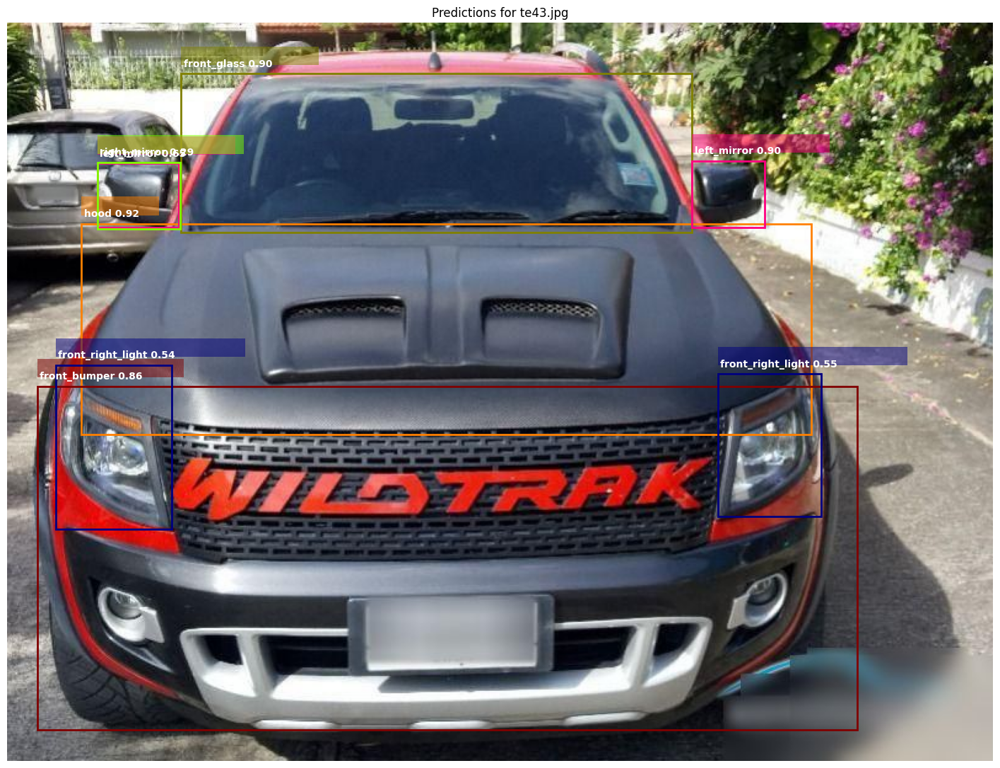


image 1/1 /content/car_parts_dataset/test/images/te3.jpg: 480x640 1 front_bumper, 1 front_glass, 1 front_left_light, 2 front_right_lights, 1 hood, 1 right_mirror, 13.0ms
Speed: 3.7ms preprocess, 13.0ms inference, 2.0ms postprocess per image at shape (1, 3, 480, 640)


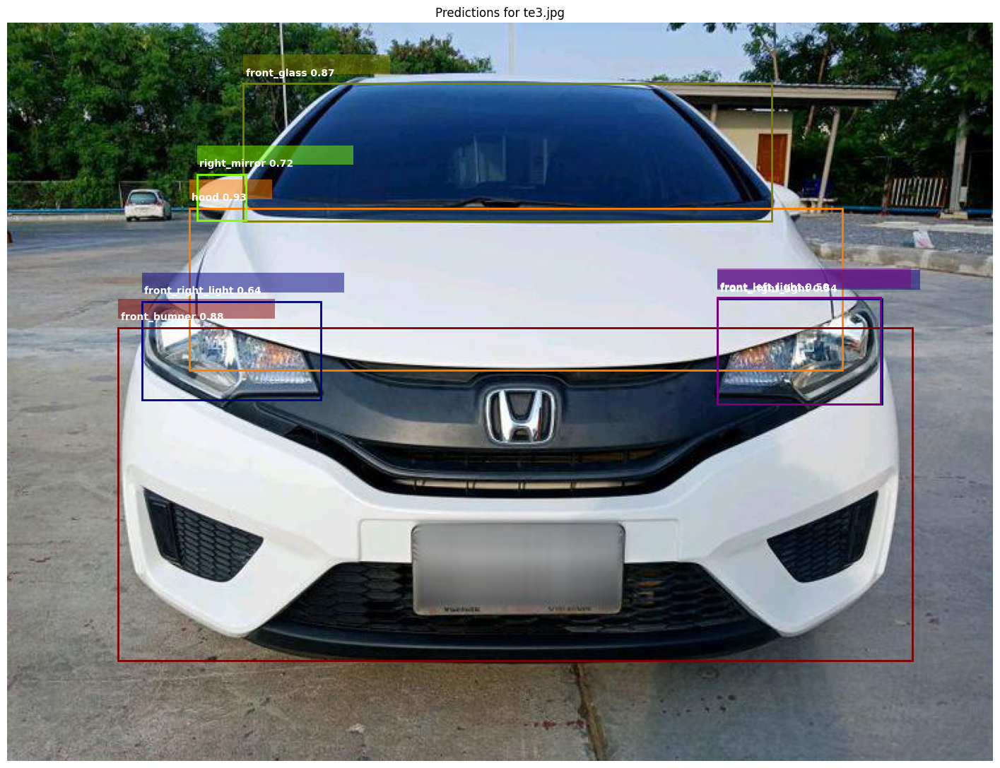


image 1/1 /content/car_parts_dataset/test/images/te12.jpg: 352x640 1 back_glass, 1 back_left_door, 1 back_left_light, 1 front_bumper, 1 front_glass, 1 front_left_door, 1 front_left_light, 1 front_right_door, 1 front_right_light, 1 hood, 1 right_mirror, 2 wheels, 16.1ms
Speed: 8.2ms preprocess, 16.1ms inference, 2.0ms postprocess per image at shape (1, 3, 352, 640)


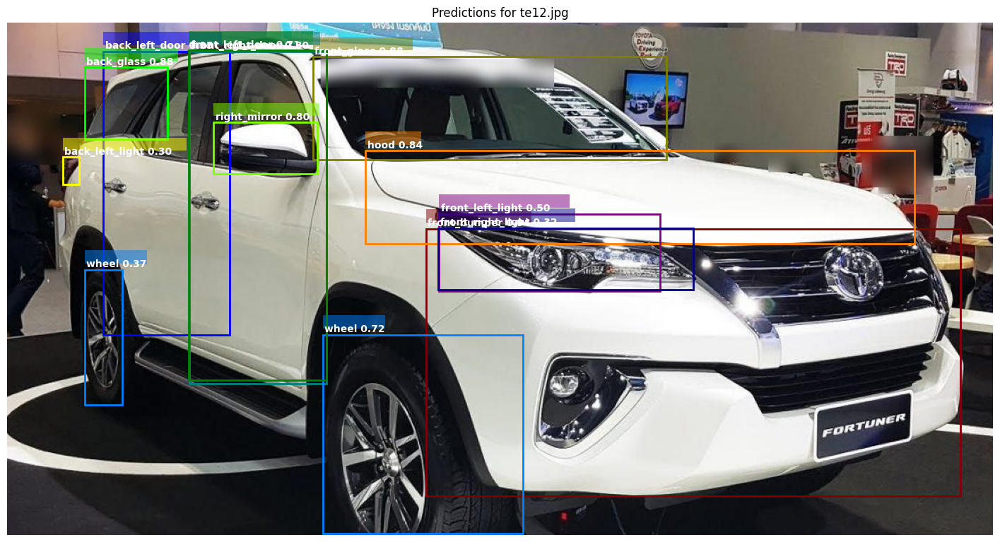


image 1/1 /content/car_parts_dataset/test/images/te17.jpg: 448x640 1 back_left_door, 1 front_bumper, 1 front_glass, 1 front_left_door, 1 front_left_light, 1 front_right_door, 1 right_mirror, 1 wheel, 16.3ms
Speed: 3.0ms preprocess, 16.3ms inference, 2.1ms postprocess per image at shape (1, 3, 448, 640)


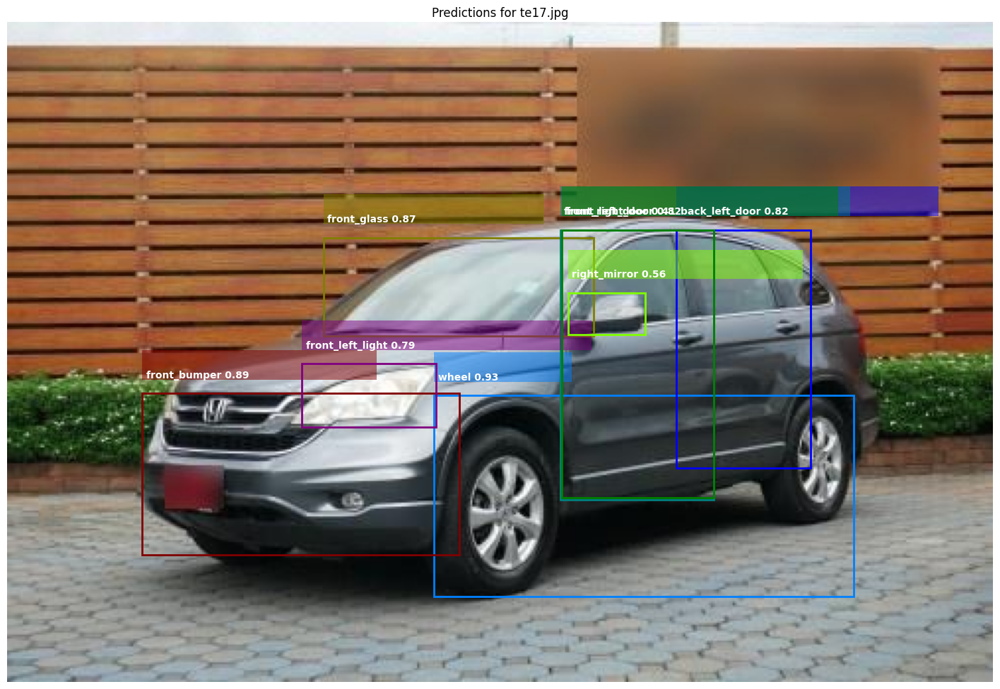


image 1/1 /content/car_parts_dataset/test/images/te98.jpg: 576x640 1 back_right_door, 1 front_bumper, 1 front_glass, 1 front_left_light, 1 front_right_door, 1 front_right_light, 1 hood, 1 left_mirror, 1 right_mirror, 1 wheel, 66.3ms
Speed: 4.0ms preprocess, 66.3ms inference, 2.1ms postprocess per image at shape (1, 3, 576, 640)


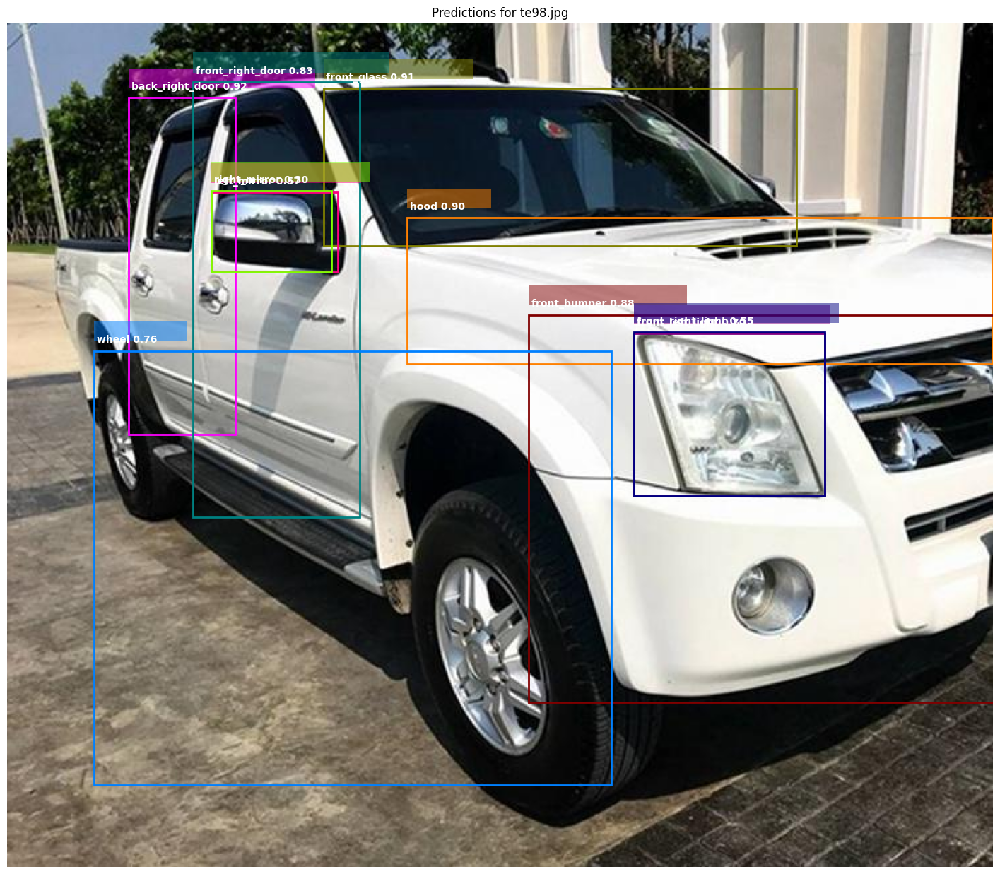

In [ ]:
# to select two random test images
test_images_path = "car_parts_dataset/test/images"
test_images = os.listdir(test_images_path)
random_images = random.sample(test_images, 5)

# colors for each class (18 unique colors)
class_colors = [
    (255, 0, 0), (0, 255, 0), (0, 0, 255), (255, 255, 0), (255, 0, 255),
    (0, 255, 255), (128, 0, 0), (128, 128, 0), (0, 128, 0), (128, 0, 128),
    (0, 128, 128), (0, 0, 128), (255, 128, 0), (255, 0, 128), (128, 255, 0),
    (128, 0, 255), (0, 255, 128), (0, 128, 255)
]

for img_name in random_images:
    img_path = os.path.join(test_images_path, img_name)
    results = model(img_path)

    # to load the image and prepare for plotting
    img = cv2.imread(img_path)
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    fig, ax = plt.subplots(figsize=(18, 18))
    ax.imshow(img_rgb)
    ax.axis("off")

    # to keep track of used text positions
    used_positions = set()

    for box in results[0].boxes:
        x1, y1, x2, y2 = map(int, box.xyxy[0])  # Bounding box coordinates
        conf = box.conf[0]  # Confidence score
        cls = int(box.cls[0])  # Class ID
        label = f"{model.names[cls]} {conf:.2f}"

        # color for the class
        color = class_colors[cls % len(class_colors)]

        # to draw the bounding box
        rect = patches.Rectangle(
            (x1, y1), x2 - x1, y2 - y1,
            linewidth=2,
            edgecolor=[c / 255 for c in color],
            facecolor='none'
        )
        ax.add_patch(rect)

        # to dynamically adjust text position to prevent overlap
        text_y = y1 - 10
        while (x1, text_y) in used_positions:
            text_y += 15  # Move text down if overlap detected
        used_positions.add((x1, text_y))

        # to draw the text background
        text_bg_width = len(label) * 7
        text_bg = patches.Rectangle(
            (x1, text_y - 12), text_bg_width, 15,
            linewidth=0,
            edgecolor='none',
            facecolor=[c / 255 for c in color] + [0.5]  # Semi-transparent
        )
        ax.add_patch(text_bg)

        # to add the label text
        ax.text(
            x1 + 2, text_y - 2, label,
            fontsize=10,
            color="white",
            verticalalignment='top',
            weight='bold'
        )

    plt.title(f"Predictions for {img_name}")
    plt.show()


image 1/1 /content/car_parts_dataset/test/images/car6.jpg: 640x640 1 back_left_door, 1 front_bumper, 1 front_glass, 1 front_left_door, 1 front_left_light, 1 hood, 1 left_mirror, 1 wheel, 17.0ms
Speed: 2.9ms preprocess, 17.0ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)


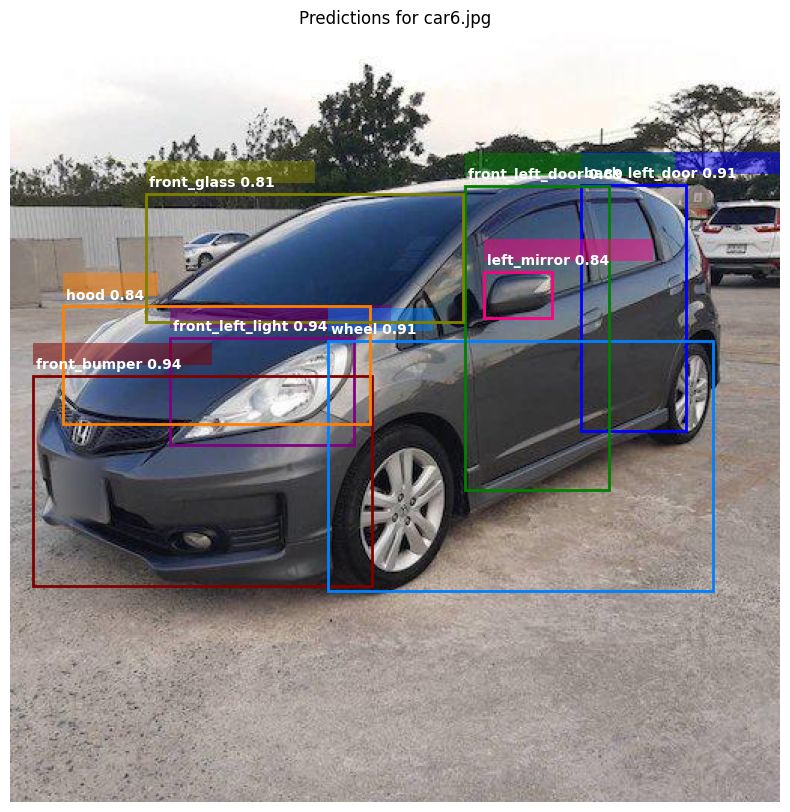

In [ ]:
# to select two random test images
test_images_path = "car_parts_dataset/test/images"
test_images = os.listdir(test_images_path)
random_images = random.sample(test_images, 1)

# colors for each class (18 unique colors)
class_colors = [
    (255, 0, 0), (0, 255, 0), (0, 0, 255), (255, 255, 0), (255, 0, 255),
    (0, 255, 255), (128, 0, 0), (128, 128, 0), (0, 128, 0), (128, 0, 128),
    (0, 128, 128), (0, 0, 128), (255, 128, 0), (255, 0, 128), (128, 255, 0),
    (128, 0, 255), (0, 255, 128), (0, 128, 255)
]

for img_name in random_images:
    img_path = os.path.join(test_images_path, img_name)
    results = model(img_path)

    # to load the image and prepare for plotting
    img = cv2.imread(img_path)
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    fig, ax = plt.subplots(figsize=(10, 10))
    ax.imshow(img_rgb)
    ax.axis("off")

    # to keep track of used text positions
    used_positions = set()

    for box in results[0].boxes:
        x1, y1, x2, y2 = map(int, box.xyxy[0])  # Bounding box coordinates
        conf = box.conf[0]  # Confidence score
        cls = int(box.cls[0])  # Class ID
        label = f"{model.names[cls]} {conf:.2f}"

        # color for the class
        color = class_colors[cls % len(class_colors)]

        # to draw the bounding box
        rect = patches.Rectangle(
            (x1, y1), x2 - x1, y2 - y1,
            linewidth=2,
            edgecolor=[c / 255 for c in color],
            facecolor='none'
        )
        ax.add_patch(rect)

        # to dynamically adjust text position to prevent overlap
        text_y = y1 - 10
        while (x1, text_y) in used_positions:
            text_y += 15  # Move text down if overlap detected
        used_positions.add((x1, text_y))

        # to draw the text background
        text_bg_width = len(label) * 7
        text_bg = patches.Rectangle(
            (x1, text_y - 12), text_bg_width, 15,
            linewidth=0,
            edgecolor='none',
            facecolor=[c / 255 for c in color] + [0.5]  # Semi-transparent
        )
        ax.add_patch(text_bg)

        # to add the label text
        ax.text(
            x1 + 2, text_y - 2, label,
            fontsize=10,
            color="white",
            verticalalignment='top',
            weight='bold'
        )

    plt.title(f"Predictions for {img_name}")
    plt.show()


image 1/1 /content/car_parts_dataset/test/images/te99.jpg: 416x640 1 back_left_door, 1 back_left_light, 1 front_left_door, 1 front_left_light, 1 right_mirror, 1 wheel, 13.8ms
Speed: 2.2ms preprocess, 13.8ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)


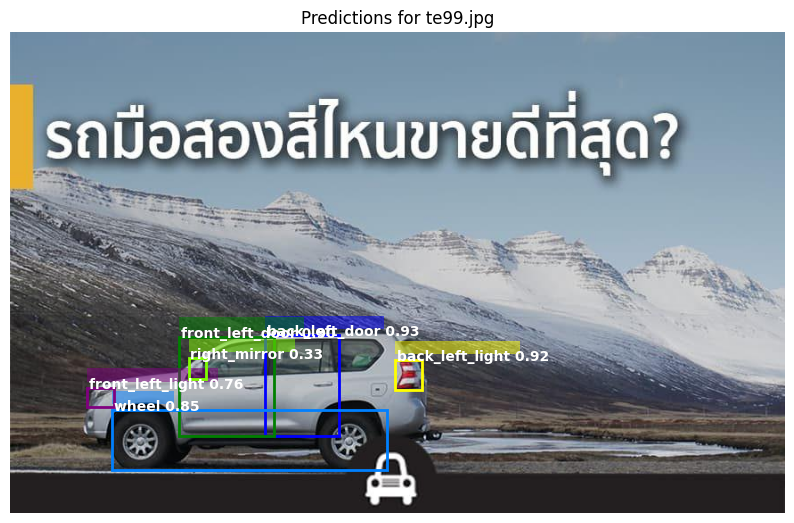

In [ ]:
# to select two random test images
test_images_path = "car_parts_dataset/test/images"
test_images = os.listdir(test_images_path)
random_images = random.sample(test_images, 1)

# colors for each class (18 unique colors)
class_colors = [
    (255, 0, 0), (0, 255, 0), (0, 0, 255), (255, 255, 0), (255, 0, 255),
    (0, 255, 255), (128, 0, 0), (128, 128, 0), (0, 128, 0), (128, 0, 128),
    (0, 128, 128), (0, 0, 128), (255, 128, 0), (255, 0, 128), (128, 255, 0),
    (128, 0, 255), (0, 255, 128), (0, 128, 255)
]

for img_name in random_images:
    img_path = os.path.join(test_images_path, img_name)
    results = model(img_path)

    # to load the image and prepare for plotting
    img = cv2.imread(img_path)
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    fig, ax = plt.subplots(figsize=(10, 10))
    ax.imshow(img_rgb)
    ax.axis("off")

    # to keep track of used text positions
    used_positions = set()

    for box in results[0].boxes:
        x1, y1, x2, y2 = map(int, box.xyxy[0])  # Bounding box coordinates
        conf = box.conf[0]  # Confidence score
        cls = int(box.cls[0])  # Class ID
        label = f"{model.names[cls]} {conf:.2f}"

        # color for the class
        color = class_colors[cls % len(class_colors)]

        # to draw the bounding box
        rect = patches.Rectangle(
            (x1, y1), x2 - x1, y2 - y1,
            linewidth=2,
            edgecolor=[c / 255 for c in color],
            facecolor='none'
        )
        ax.add_patch(rect)

        # to dynamically adjust text position to prevent overlap
        text_y = y1 - 10
        while (x1, text_y) in used_positions:
            text_y += 15  # Move text down if overlap detected
        used_positions.add((x1, text_y))

        # to draw the text background
        text_bg_width = len(label) * 7
        text_bg = patches.Rectangle(
            (x1, text_y - 12), text_bg_width, 15,
            linewidth=0,
            edgecolor='none',
            facecolor=[c / 255 for c in color] + [0.5]  # Semi-transparent
        )
        ax.add_patch(text_bg)

        # to add the label text
        ax.text(
            x1 + 2, text_y - 2, label,
            fontsize=10,
            color="white",
            verticalalignment='top',
            weight='bold'
        )

    plt.title(f"Predictions for {img_name}")
    plt.show()

##**To analyze the class-wise performance**

In [ ]:
# dictionary to store counts of low-confidence detections per class
difficult_classes = {}

# Iterate through results to analyze boxes
for result in results:
    for box in result.boxes:
        cls = int(box.cls[0])  # Class ID
        confidence = box.conf[0]  # Confidence score

        # Initialize the count for the class if not already present
        if cls not in difficult_classes:
            difficult_classes[cls] = {"low_confidence": 0, "total": 0}

        # Increment the total count for the class
        difficult_classes[cls]["total"] += 1

        # Increment the low-confidence count if below the threshold
        if confidence < 0.5:
            difficult_classes[cls]["low_confidence"] += 1

# Identify and display classes with high localization difficulty
print("Class-wise Localization Difficulty:")
for cls, stats in difficult_classes.items():
    total = stats["total"]
    low_conf = stats["low_confidence"]
    difficulty_ratio = low_conf / total if total > 0 else 0

    print(f"Class: {model.names[cls]} ({cls})")
    print(f"  - Total Detections: {total}")
    print(f"  - Low Confidence (< 0.5): {low_conf}")
    print(f"  - Difficulty Ratio: {difficulty_ratio:.2f}\n")

# Highlight the most difficult classes based on difficulty ratio
most_difficult = {cls: stats for cls, stats in difficult_classes.items()
                    if stats["low_confidence"] > 0.3 * stats["total"]}
print("Classes with High Localization Difficulty:")
for cls in most_difficult:
    print(f"  - {model.names[cls]} ({cls})")

Class-wise Localization Difficulty:
Class: front_glass (7)
  - Total Detections: 1
  - Low Confidence (< 0.5): 0
  - Difficulty Ratio: 0.00

Class: front_right_door (10)
  - Total Detections: 2
  - Low Confidence (< 0.5): 0
  - Difficulty Ratio: 0.00

Class: front_bumper (6)
  - Total Detections: 1
  - Low Confidence (< 0.5): 0
  - Difficulty Ratio: 0.00

Class: hood (12)
  - Total Detections: 1
  - Low Confidence (< 0.5): 0
  - Difficulty Ratio: 0.00

Class: wheel (17)
  - Total Detections: 2
  - Low Confidence (< 0.5): 0
  - Difficulty Ratio: 0.00

Class: right_mirror (14)
  - Total Detections: 1
  - Low Confidence (< 0.5): 0
  - Difficulty Ratio: 0.00

Class: front_left_light (9)
  - Total Detections: 1
  - Low Confidence (< 0.5): 1
  - Difficulty Ratio: 1.00

Class: back_right_door (4)
  - Total Detections: 1
  - Low Confidence (< 0.5): 1
  - Difficulty Ratio: 1.00

Classes with High Localization Difficulty:
  - front_left_light (9)
  - back_right_door (4)


#To export the trained Model

In [ ]:
# to save the trained model
model.export(format="onnx")  # Exporting to ONNX format for further deployment purposes

Ultralytics 8.3.55 🚀 Python-3.10.12 torch-2.5.1+cu121 CPU (Intel Xeon 2.20GHz)

PyTorch: starting from 'runs/detect/car_parts_detection5/weights/best.pt' with input shape (1, 3, 640, 640) BCHW and output shape(s) (1, 22, 8400) (21.5 MB)

ONNX: starting export with onnx 1.17.0 opset 19...
ONNX: slimming with onnxslim 0.1.45...
ONNX: export success ✅ 13.9s, saved as 'runs/detect/car_parts_detection5/weights/best.onnx' (42.7 MB)

Export complete (16.5s)
Results saved to /content/runs/detect/car_parts_detection5/weights
Predict:         yolo predict task=detect model=runs/detect/car_parts_detection5/weights/best.onnx imgsz=640  
Validate:        yolo val task=detect model=runs/detect/car_parts_detection5/weights/best.onnx imgsz=640 data=car_parts_dataset.yaml  
Visualize:       https://netron.app


'runs/detect/car_parts_detection5/weights/best.onnx'